In [1]:
%config IPCompleter.greedy=True

# Project: National Longitudinal Survey of Youth 1979

## An Analysis on the effects of characteristics on Unemployment.

With this analysis I will find what variables are most important for desirable and undesirable outcomes.

My hypothesis are that the these variables will provide a broader and more robust picture of which Americans go through struggles or which Americans conditions are resilient to unemployment.

I will attempt to find the underlying importance of certain exogenous variables to explain key endogenous variables.

### Exogenous variables

- Age
- Race
- Sex
- Math ASVAB score
- Word ASVAB score
- College Major
- Highest Degree Received
- Occupation
- Class of Worker
- Firm Size (that one works at, or owns)
- Income
- Region
- Marital Status
- Urban or Rural Household

### Endogenous Variables

- Unemployed for a period in 2016

### ASVAB

> The **Armed Services Vocational Aptitude Battery** (**ASVAB**) is a multiple
> choice test, administered by the United States Military Entrance Processing
> Command, used to determine qualification for enlistment in the United States
> Armed Forces. It is often offered to U.S. high school students when they are
> in the 10th, 11th and 12th grade, though anyone eligible for enlistment may
> take it.

Taken from [Armed Services Vocational Aptitude Battery - Wikipedia](https://en.wikipedia.org/wiki/Armed_Services_Vocational_Aptitude_Battery)

### Empirical Approach

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from pandas_profiling import ProfileReport

url = "NLS_79/NLS_79.csv"
df = pd.read_csv(url)
df.columns = [
    "case_id",
    "age",
    "hgc_mother",
    "hgc_father",
    "sample_id",
    "sample_race",
    "sample_sex",
    "pov_1980",
    "asvab_math",
    "asvab_word",
    "major",
    "max_degree",
    "occup_2016",
    "css_worker",
    "firm_size",
    "unemp_2016",
    "income_2016",
    "fam_net_worth",
    "ch_health_limit",
    "fam_size",
    "fam_net_income",
    "fam_pov",
    "region",
    "marital",
    "urban_rural",
]

df.shape

# plt.style.use("dracula")

(12686, 25)

### Description of Variables

| #   | RNUM     | QUESTION NAME   | VARIABLE TITLE                                                   | YEAR   | #VALID |
| --- | -------- | --------------- | ---------------------------------------------------------------- | ------ | ------ |
| 1   | R0000100 | case_id         | IDENTIFICATION CODE                                              | 1979   | 12686  |
| 2   | R0000600 | age             | AGE OF R                                                         | 1979   | 12686  |
| 3   | R0006500 | hgc_mother      | HIGHEST GRADE COMPLETED BY R'S MOTHER                            | 1979   | 12659  |
| 4   | R0007900 | hgc_father      | HIGHEST GRADE COMPLETED BY R'S FATHER                            | 1979   | 12456  |
| 5   | R0173600 | sample_id       | SAMPLE IDENTIFICATION CODE                                       | 1979   | 12686  |
| 6   | R0214700 | sample_race     | R'S RACIAL/ETHNIC COHORT FROM SCREENER                           | 78SCRN | 12686  |
| 7   | R0214800 | sample_sex      | SEX OF R                                                         | 1979   | 12686  |
| 8   | R0618500 | pov_1980        | FAMILY POVERTY STATUS IN 1980                                    | 1981   | 12195  |
| 9   | R0648301 | asvab_math      | ASVAB - ARITHMETIC REASONING/MATHEMATICS KNOWLEDGE Z SCORE       | XRND   | 11152  |
| 10  | R0648343 | asvab_word      | ASVAB - WORD KNOWLEDGE Z SCORE                                   | XRND   | 11160  |
| 11  | R1207800 | major           | MAJOR FIELD OF STUDY AT MOST RECENT COLLEGE ATTENDED             | 1984   | 5293   |
| 12  | R2509800 | max_degree      | HIGHEST DEGREE EVER RECEIVED                                     | 1988   | 8571   |
| 13  | T5256900 | occup           | OCCUPATION (CENSUS 4 DIGIT,00 CODES) (ALL) JOB #01               | 2016   | 5323   |
| 14  | T5257400 | css_worker      | CLASS OF WORKER (ALL) JOB #01                                    | 2016   | 5374   |
| 15  | T5344300 | firm_size       | # OF EMPLOYEES AT LOCATION OF R'S JOB # 01                       | 2016   | 4575   |
| 16  | T5407500 | unemp_2016      | INT CHECK - ANY PERIODS NOT EMPLOYED IN WORK HISTORY CALENDAR?   | 2016   | 6912   |
| 17  | T5619500 | income_2016     | TOTAL INCOME FROM WAGES AND SALARY IN PAST CALENDAR YEAR (TRUNC) | 2016   | 6909   |
| 18  | T5684500 | fam_net_worth   | FAMILY NET WEALTH (TRUNC) _KEY_                                  | 2016   | 6912   |
| 19  | T5734600 | ch_health_limit | CHANCES RS HEALTH LIMITS WORK IN NEXT 10 YEARS                   | 2016   | 6909   |
| 20  | T5770700 | fam_size        | FAMILY SIZE                                                      | 2016   | 6912   |
| 21  | T5770800 | fam_net_income  | TOTAL NET FAMILY INCOME IN PAST CALENDAR YEAR _KEY_ (TRUNCATED)  | 2016   | 6912   |
| 22  | T5770900 | fam_pov         | FAMILY POVERTY STATUS IN PREVIOUS CALENDAR YEAR                  | 2016   | 6912   |
| 23  | T5771000 | region          | REGION OF CURRENT RESIDENCE                                      | 2016   | 6850   |
| 24  | T5771200 | marital         | MARITAL STATUS                                                   | 2016   | 6912   |
| 25  | T5774000 | urban_rural     | IS R'S CURRENT RESIDENCE URBAN/RURAL?                            | 2016   | 6850   |


### Extended Description of Variables

```
╔═══════════╦═════════════════╦════════╦════════════════════════════════════════════════════════════════════════════════════╗
║ RNUM      ║ QNAME           ║ YEAR   ║ DESCRIPTION                                                                        ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R00001.00 ║ case_id         ║ 1979   ║ ORIGINAL QUESTION NAME: CASEID                                                     ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ NOTE: THIS NUMBER WAS ASSIGNED ACCORDING TO THE RECORD NUMBER OF EACH RESPONDENT   ║
║           ║                 ║        ║ ON THE TAPE. THE FIRST RESPONDENT WAS ASSIGNED ID#1, THE SECOND WAS ASSIGNED       ║
║           ║                 ║        ║ ID#2, ETC.                                                                         ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R0000600  ║ age             ║ 1979   ║ AGE OF R                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: S01Q01B                                                    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ AND THAT MAKES YOU (R'S AGE ON HOUSEHOLD ENUMERATION). IS THAT CORRECT ? (IF       ║
║           ║                 ║        ║ NECESSARY CORRECT HOUSEHOLD ENUMERATION.)                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ACTUAL AGE                                                                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: All                                                                      ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      950          14                                                               ║
║           ║                 ║        ║     1563          15                                                               ║
║           ║                 ║        ║     1561          16                                                               ║
║           ║                 ║        ║     1508          17                                                               ║
║           ║                 ║        ║     1634          18                                                               ║
║           ║                 ║        ║     1677          19                                                               ║
║           ║                 ║        ║     1666          20                                                               ║
║           ║                 ║        ║     1690          21                                                               ║
║           ║                 ║        ║      437          22                                                               ║
║           ║                 ║        ║   -------                                                                          ║
║           ║                 ║        ║    12686                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)            0                                                           ║
║           ║                 ║        ║ Don't Know(-2)         0                                                           ║
║           ║                 ║        ║ TOTAL =========>   12686   VALID SKIP(-4)       0     NON-INTERVIEW(-5)       0    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Min:             14        Max:             22        Mean:                17.9    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Lead In: R00005.00[Default]                                                        ║
║           ║                 ║        ║ Default Next Question: R00007.00                                                   ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R00065.00 ║ hgc_mother      ║ 1979   ║ HIGHEST GRADE COMPLETED BY R'S MOTHER                                              ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: S01Q16                                                     ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ WHAT IS THE HIGHEST GRADE OR YEAR OF REGULAR SCHOOL THAT YOUR MOTHER EVER          ║
║           ║                 ║        ║ COMPLETED?                                                                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: R with mother/mother figure                                              ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   132         0 NONE                                                               ║
║           ║                 ║        ║    24         1 1ST GRADE                                                          ║
║           ║                 ║        ║    87         2 2ND GRADE                                                          ║
║           ║                 ║        ║   183         3 3RD GRADE                                                          ║
║           ║                 ║        ║   173         4 4TH GRADE                                                          ║
║           ║                 ║        ║   198         5 5TH GRADE                                                          ║
║           ║                 ║        ║   421         6 6TH GRADE                                                          ║
║           ║                 ║        ║   260         7 7TH GRADE                                                          ║
║           ║                 ║        ║   801         8 8TH GRADE                                                          ║
║           ║                 ║        ║   698         9 9TH GRADE                                                          ║
║           ║                 ║        ║   999        10 10TH GRADE                                                         ║
║           ║                 ║        ║  1107        11 11TH GRADE                                                         ║
║           ║                 ║        ║  4817        12 12TH GRADE                                                         ║
║           ║                 ║        ║   364        13 1ST YR COL                                                         ║
║           ║                 ║        ║   561        14 2ND YR COL                                                         ║
║           ║                 ║        ║   178        15 3RD YR COL                                                         ║
║           ║                 ║        ║   647        16 4TH YR COL                                                         ║
║           ║                 ║        ║   101        17 5TH YR COL                                                         ║
║           ║                 ║        ║    92        18 6TH YR COL                                                         ║
║           ║                 ║        ║    14        19 7TH YR COL                                                         ║
║           ║                 ║        ║    21        20 8TH YR COL OR MORE                                                 ║
║           ║                 ║        ║     0        95 UNGRADED                                                           ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R00079.00 ║ hgc_father      ║ 1979   ║ HIGHEST GRADE COMPLETED BY R'S FATHER                                              ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: S01Q23                                                     ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ LET'S GO BACK TO YOUR FATHER NOW. WHAT IS THE HIGHEST GRADE OR YEAR OF REGULAR     ║
║           ║                 ║        ║ SCHOOL THAT YOUR FATHER EVER COMPLETED?                                            ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: R with father/father figure                                              ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   199          0 NONE                                                              ║
║           ║                 ║        ║    48          1 1ST GRADE                                                         ║
║           ║                 ║        ║   102          2 2ND GRADE                                                         ║
║           ║                 ║        ║   215          3 3RD GRADE                                                         ║
║           ║                 ║        ║   208          4 4TH GRADE                                                         ║
║           ║                 ║        ║   190          5 5TH GRADE                                                         ║
║           ║                 ║        ║   499          6 6TH GRADE                                                         ║
║           ║                 ║        ║   306          7 7TH GRADE                                                         ║
║           ║                 ║        ║   950          8 8TH GRADE                                                         ║
║           ║                 ║        ║   568          9 9TH GRADE                                                         ║
║           ║                 ║        ║   754         10 10TH GRADE                                                        ║
║           ║                 ║        ║   616         11 11TH GRADE                                                        ║
║           ║                 ║        ║  3694         12 12TH GRADE                                                        ║
║           ║                 ║        ║   286         13 1ST YR COL                                                        ║
║           ║                 ║        ║   558         14 2ND YR COL                                                        ║
║           ║                 ║        ║   162         15 3RD YR COL                                                        ║
║           ║                 ║        ║   899         16 4TH YR COL                                                        ║
║           ║                 ║        ║   151         17 5TH YR COL                                                        ║
║           ║                 ║        ║   209         18 6TH YR COL                                                        ║
║           ║                 ║        ║    56         19 7TH YR COL                                                        ║
║           ║                 ║        ║   210         20 8TH YR COL OR MORE                                                ║
║           ║                 ║        ║     0         95 UNGRADED                                                          ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R01736.00 ║ sample_id       ║ 1979   ║ SAMPLE IDENTIFICATION CODE                                                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: S24Q01                                                     ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: Entire Sample                                                            ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║  2236         1 CROSS MALE WHITE                                                   ║
║           ║                 ║        ║   203         2 CROSS MALE WH. POOR                                                ║
║           ║                 ║        ║   346         3 CROSS MALE BLACK                                                   ║
║           ║                 ║        ║   218         4 CROSS MALE HISPANIC                                                ║
║           ║                 ║        ║  2279         5 CROSS FEMALE WHITE                                                 ║
║           ║                 ║        ║   198         6 CROSS FEMALE WH POOR                                               ║
║           ║                 ║        ║   405         7 CROSS FEMALE BLACK                                                 ║
║           ║                 ║        ║   226         8 CROSS FEMALE HISPANIC                                              ║
║           ║                 ║        ║   742         9 SUP MALE WH POOR                                                   ║
║           ║                 ║        ║  1105        10 SUP MALE BLACK                                                     ║
║           ║                 ║        ║   729        11 SUP MALE HISPANIC                                                  ║
║           ║                 ║        ║   901        12 SUP FEM WH POOR                                                    ║
║           ║                 ║        ║  1067        13 SUP FEMALE BLACK                                                   ║
║           ║                 ║        ║   751        14 SUP FEMALE HISPANIC                                                ║
║           ║                 ║        ║   609        15 MIL MALE WHITE                                                     ║
║           ║                 ║        ║   162        16 MIL MALE BLACK                                                     ║
║           ║                 ║        ║    53        17 MIL MALE HISPANIC                                                  ║
║           ║                 ║        ║   342        18 MIL FEMALE WHITE                                                   ║
║           ║                 ║        ║    89        19 MIL FEMALE BLACK                                                   ║
║           ║                 ║        ║    25        20 MIL FEMALE HISPANIC                                                ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R02147.00 ║ sample_race     ║ 78SCRN ║ R'S RACIAL/ETHNIC COHORT FROM SCREENER                                             ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: Entire Sample                                                            ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║  2002       1 HISPANIC                                                             ║
║           ║                 ║        ║  3174       2 BLACK                                                                ║
║           ║                 ║        ║  7510       3 NON-BLACK, NON-HISPANIC                                              ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R02148.00 ║ sample_sex      ║ 1979   ║ SEX OF R                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: Entire sample                                                            ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║  6403       1 MALE                                                                 ║
║           ║                 ║        ║  6283       2 FEMALE                                                               ║
║           ║                 ║        ║  -------                                                                           ║
║           ║                 ║        ║  12686                                                                             ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)          0                                                             ║
║           ║                 ║        ║ Don't Know(-2)       0                                                             ║
║           ║                 ║        ║ TOTAL =========> 12686  VALID SKIP(-4)  0 NON-INTERVIEW(-5)     0                  ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R0618500  ║ pov_1980        ║ 1980   ║ FAMILY POVERTY STATUS IN 1980                                                      ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: *CREATED                                                   ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ NOTE: FOR VARIABLE CREATION, SEE APPENDIX 2: TOTAL NET FAMILY INCOME               ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     1978       1 IN POVERTY                                                        ║
║           ║                 ║        ║     7806       0 NOT IN POVERTY                                                    ║
║           ║                 ║        ║   -------                                                                          ║
║           ║                 ║        ║     9784                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)            0                                                           ║
║           ║                 ║        ║ Don't Know(-2)         0                                                           ║
║           ║                 ║        ║ Invalid Skip(-3)    2411                                                           ║
║           ║                 ║        ║ TOTAL =========>   12195   VALID SKIP(-4)       0     NON-INTERVIEW(-5)     491    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Min:              0        Max:              1        Mean:                  .2    ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R0648301  ║ asvab_math      ║ XRND   ║ ASVAB - ARITHMETIC REASONING/MATHEMATICS KNOWLEDGE Z SCORE                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: *CREATED                                                   ║
║           ║                 ║        ║ NOTE: TWO IMPLIED DECIMAL PLACES. DIVIDE BY 100 & SUBTRACT 5 TO GET ORIGINAL Z     ║
║           ║                 ║        ║ SCORE.                                                                             ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ NOTE:  NORMING PROCEDURE:  RESPONDENTS WERE GROUPED INTO FOUR-MONTH AGE            ║
║           ║                 ║        ║ INTERVALS FOR EACH BIRTH YEAR.  WITHIN EACH AGE GROUP, IRT THETA SCORES WERE       ║
║           ║                 ║        ║ RANKED FROM LOWEST TO HIGHEST AND A NONPARAMETRIC DISTRIBUTION FUNCTION WAS        ║
║           ║                 ║        ║ CALCULATED USING THE ASVAB SAMPLING WEIGHTS. THESE ESTIMATED PROBABILITIES WERE    ║
║           ║                 ║        ║ TRANSFORMED TO STANDARD NORMAL Z SCORES.                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║       17         150 TO 199                                                        ║
║           ║                 ║        ║       99         200 TO 249                                                        ║
║           ║                 ║        ║      295         250 TO 299                                                        ║
║           ║                 ║        ║      739         300 TO 349                                                        ║
║           ║                 ║        ║     1437         350 TO 399                                                        ║
║           ║                 ║        ║     1987         400 TO 449                                                        ║
║           ║                 ║        ║     2151         450 TO 499                                                        ║
║           ║                 ║        ║     1871         500 TO 549                                                        ║
║           ║                 ║        ║     1329         550 TO 599                                                        ║
║           ║                 ║        ║      705         600 TO 649                                                        ║
║           ║                 ║        ║      334         650 TO 699                                                        ║
║           ║                 ║        ║      120         700 TO 749                                                        ║
║           ║                 ║        ║       67         750 TO 799                                                        ║
║           ║                 ║        ║        1         800 TO 9999999: 800+                                              ║
║           ║                 ║        ║   -------                                                                          ║
║           ║                 ║        ║    11152                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)            0                                                           ║
║           ║                 ║        ║ Don't Know(-2)         0                                                           ║
║           ║                 ║        ║ TOTAL =========>   11152   VALID SKIP(-4)    1534     NON-INTERVIEW(-5)       0    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Min:            166        Max:            825        Mean:              475.04    ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R0648343  ║ asvab_word      ║ XRND   ║ ASVAB - WORD KNOWLEDGE Z SCORE                                                     ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: *CREATED                                                   ║
║           ║                 ║        ║ NOTE: TWO IMPLIED DECIMAL PLACES. DIVIDE BY 100 & SUBTRACT 5 TO GET ORIGINAL Z     ║
║           ║                 ║        ║ SCORE.                                                                             ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ NOTE:  NORMING PROCEDURE:  RESPONDENTS WERE GROUPED INTO FOUR-MONTH AGE            ║
║           ║                 ║        ║ INTERVALS FOR EACH BIRTH YEAR.  WITHIN EACH AGE GROUP, IRT THETA SCORES WERE       ║
║           ║                 ║        ║ RANKED FROM LOWEST TO HIGHEST AND A NONPARAMETRIC DISTRIBUTION FUNCTION WAS        ║
║           ║                 ║        ║ CALCULATED USING THE ASVAB SAMPLING WEIGHTS. THESE ESTIMATED PROBABILITIES WERE    ║
║           ║                 ║        ║ TRANSFORMED TO STANDARD NORMAL Z SCORES.                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║       22         150 TO 199                                                        ║
║           ║                 ║        ║       91         200 TO 249                                                        ║
║           ║                 ║        ║      281         250 TO 299                                                        ║
║           ║                 ║        ║      774         300 TO 349                                                        ║
║           ║                 ║        ║     1489         350 TO 399                                                        ║
║           ║                 ║        ║     2033         400 TO 449                                                        ║
║           ║                 ║        ║     2057         450 TO 499                                                        ║
║           ║                 ║        ║     1772         500 TO 549                                                        ║
║           ║                 ║        ║     1307         550 TO 599                                                        ║
║           ║                 ║        ║      642         600 TO 649                                                        ║
║           ║                 ║        ║      572         650 TO 699                                                        ║
║           ║                 ║        ║      116         700 TO 749                                                        ║
║           ║                 ║        ║        3         750 TO 799                                                        ║
║           ║                 ║        ║        1         800 TO 9999999: 800+                                              ║
║           ║                 ║        ║   -------                                                                          ║
║           ║                 ║        ║    11160                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)            0                                                           ║
║           ║                 ║        ║ Don't Know(-2)         0                                                           ║
║           ║                 ║        ║ TOTAL =========>   11160   VALID SKIP(-4)    1526     NON-INTERVIEW(-5)       0    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Min:            168        Max:            825        Mean:              475.07    ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R1207800  ║ major           ║ 1984   ║ MAJOR FIELD OF STUDY AT MOST RECENT COLLEGE ATTENDED                               ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: Q0373                                                      ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ WHAT (IS/WAS) YOUR FIELD OF STUDY AT (NAME OF SCHOOL)? PROBE IF                    ║
║           ║                 ║        ║ NECESSARY: WHAT (ARE/WERE) YOUR MAJORING IN?                                       ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ SEE ATTACHMENT 4, FIELDS OF STUDY IN COLLEGE                                       ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: R is/was attending college/university                                    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      327           0                                                               ║
║           ║                 ║        ║        0           1 TO 99                                                         ║
║           ║                 ║        ║       73         100 TO 199                                                        ║
║           ║                 ║        ║       55         200 TO 299                                                        ║
║           ║                 ║        ║        0         300 TO 399                                                        ║
║           ║                 ║        ║      156         400 TO 499                                                        ║
║           ║                 ║        ║     1401         500 TO 599                                                        ║
║           ║                 ║        ║      141         600 TO 699                                                        ║
║           ║                 ║        ║      362         700 TO 799                                                        ║
║           ║                 ║        ║      440         800 TO 899                                                        ║
║           ║                 ║        ║      406         900 TO 999                                                        ║
║           ║                 ║        ║     1930        1000 TO 9999999: 1000+                                             ║
║           ║                 ║        ║   -------                                                                          ║
║           ║                 ║        ║     5291                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)            0                                                           ║
║           ║                 ║        ║ Don't Know(-2)         0                                                           ║
║           ║                 ║        ║ Invalid Skip(-3)       2                                                           ║
║           ║                 ║        ║ TOTAL =========>    5293   VALID SKIP(-4)    6776     NON-INTERVIEW(-5)     617    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Min:              0        Max:           9996        Mean:             1233.85    ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ R25098.00 ║ max_degree      ║ 1988   ║ HIGHEST DEGREE EVER RECEIVED                                                       ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ ORIGINAL QUESTION NAME: Q3.9A                                                      ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ (HAND CARD B) WHAT IS THE NAME OF THE HIGHEST DEGREE YOU HAVE EVER                 ║
║           ║                 ║        ║ RECEIVED?                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ UNIVERSE: All except those without any formal schooling; currently enrolled >=     ║
║           ║                 ║        ║ 13; has HS diploma or equivalent                                                   ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║  6031       1 HIGH SCHOOL DIPLOMA (OR EQUIVALENT)                                  ║
║           ║                 ║        ║   626       2 ASSOCIATE/JUNIOR COLLEGE (AA)                                        ║
║           ║                 ║        ║   587       3 BACHELOR OF ARTS DEGREE (BA)                                         ║
║           ║                 ║        ║   922       4 BACHELOR OF SCIENCE (BS)                                             ║
║           ║                 ║        ║   178       5 MASTER'S DEGREE (MA,MBA,MS,MSW)                                      ║
║           ║                 ║        ║    11       6 DOCTORAL DEGREE (PHD)                                                ║
║           ║                 ║        ║    49       7 PROFESSIONAL DEGREE (MD,LLD,DDS)                                     ║
║           ║                 ║        ║   160       8 OTHER                                                                ║
║           ║                 ║        ║  -------                                                                           ║
║           ║                 ║        ║  8564                                                                              ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)         1                                                              ║
║           ║                 ║        ║ Don't Know(-2)      0                                                              ║
║           ║                 ║        ║ Invalid Skip(-3)    6                                                              ║
║           ║                 ║        ║ TOTAL =========> 8571      VALID SKIP(-4)   1894       NON-INTERVIEW(-5)    2221   ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T5256900  ║ occup_2016      ║ 2016   ║ OCCUPATION (CENSUS 4 DIGIT, 00 CODES) (ALL) JOB #01                                ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ COMMENT: 1970 CENSUS CODE FOR OCCUPATION - EMPLOYER                                ║
║           ║                 ║        ║ SEE ATTACHMENT 3, INDUSTRY AND OCCUPATION CODES                                    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ INCLUDES DATA FOR ALL R'S REPORTING EMPLOYER                                       ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      665          10 TO 430: Executive, Administrative and Managerial              ║
║           ║                 ║        ║                           Occupations                                              ║
║           ║                 ║        ║      266         500 TO 950: Management Related Occupations                        ║
║           ║                 ║        ║      110        1000 TO 1240: Mathematical and Computer Scientists                 ║
║           ║                 ║        ║       85        1300 TO 1560: Engineers, Architects, Surveyers, Engineering and    ║
║           ║                 ║        ║                               Related Technicians                                  ║
║           ║                 ║        ║       18        1600 TO 1760: Physical Scientists                                  ║
║           ║                 ║        ║       10        1800 TO 1860: Social Scientists and Related Workers                ║
║           ║                 ║        ║       11        1900 TO 1960: Life, Physical and Social Science Technicians        ║
║           ║                 ║        ║      113        2000 TO 2060: Counselors, Sociala and Religious Workers            ║
║           ║                 ║        ║       48        2100 TO 2150: Lawyers, Judges and Legal Support Workers            ║
║           ║                 ║        ║      233        2200 TO 2340: Teachers                                             ║
║           ║                 ║        ║       88        2400 TO 2550: Education, Training and Library Workers              ║
║           ║                 ║        ║       67        2600 TO 2760: Entertainers and Performers, Sports and Related      ║
║           ║                 ║        ║                               Workers                                              ║
║           ║                 ║        ║       34        2800 TO 2960: Media and Communications Workers                     ║
║           ║                 ║        ║      134        3000 TO 3260: Health Diagnosing and Treating Practitioners         ║
║           ║                 ║        ║      249        3300 TO 3650: Health Care Technical and Support Occupations        ║
║           ║                 ║        ║      144        3700 TO 3950: Protective Service Occupations                       ║
║           ║                 ║        ║      209        4000 TO 4160: Food Preparation and Serving Related Occupations     ║
║           ║                 ║        ║      272        4200 TO 4250: Cleaning and Building Service Occupations            ║
║           ║                 ║        ║       18        4300 TO 4430: Entertainment Attendants and Related Workers         ║
║           ║                 ║        ║      202        4500 TO 4650: Personal Care and Service Workers                    ║
║           ║                 ║        ║      374        4700 TO 4960: Sales and Related Workers                            ║
║           ║                 ║        ║      718        5000 TO 5930: Office and Administrative Support Workers            ║
║           ║                 ║        ║       21        6000 TO 6130: Farming, Fishing and Forestry Occupations            ║
║           ║                 ║        ║      278        6200 TO 6940: Construction Trade and Extraction Workers            ║
║           ║                 ║        ║      206        7000 TO 7620: Installation, Maintenance and Repairs Workers        ║
║           ║                 ║        ║       84        7700 TO 7750: Production and Operating Workers                     ║
║           ║                 ║        ║       12        7800 TO 7850: Food Preparation Occupations                         ║
║           ║                 ║        ║      246        7900 TO 8960: Setters, Operators and Tenders                       ║
║           ║                 ║        ║      397        9000 TO 9750: Transportation and Material Moving Workers           ║
║           ║                 ║        ║        6        9840: Armed Forces                                                 ║
║           ║                 ║        ║        4        9990: Uncodeable                                                   ║
║           ║                 ║        ║   -------                                                                          ║
║           ║                 ║        ║     5323                                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)            0                                                           ║
║           ║                 ║        ║ Don't Know(-2)         0                                                           ║
║           ║                 ║        ║ TOTAL =========>    5323   VALID SKIP(-4)    1589     NON-INTERVIEW(-5)    5774    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Min:              5        Max:           9990        Mean:             4245.22    ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T52574.00 ║ css_worker      ║ 2016   ║ CLASS OF WORKER (ALL) JOB #01                                                      ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ COMMENT: CLASS OF WORKER - EMPLOYER                                                ║
║           ║                 ║        ║ INCLUDES DATA FOR ALL R'S REPORTING EMPLOYER                                       ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║  1102       1: 1 Government                                                        ║
║           ║                 ║        ║  2903       2: 2 Private for profit company                                        ║
║           ║                 ║        ║   465       3: 3 Non-profit organization (including tax exempt and                 ║
║           ║                 ║        ║                    charitable)                                                     ║
║           ║                 ║        ║   700       4: 4 Self employed                                                     ║
║           ║                 ║        ║    56       5: 5 Working in family business                                        ║
║           ║                 ║        ║  -------                                                                           ║
║           ║                 ║        ║  5226                                                                              ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)         7                                                              ║
║           ║                 ║        ║ Don't Know(-2)    127                                                              ║
║           ║                 ║        ║ Invalid Skip(-3)   14                                                              ║
║           ║                 ║        ║ TOTAL =========> 5374       VALID SKIP(-4)  1538        NON-INTERVIEW(-5)   5774   ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T53443.00 ║ firm_size       ║ 2016   ║ # OF EMPLOYEES AT LOCATION OF R'S JOB # 01                                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ At the place where you [(work/worked)], how many employees ([(does/did)]           ║
║           ║                 ║        ║ [(employer name)]([QES-LOOP1 counter])/[do/did] you) have? (INTERVIEWER: IF        ║
║           ║                 ║        ║ VOLUNTEERED "NUMBER VARIES", ENTER "99995".)                                       ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║  1931       1 TO 49                                                                ║
║           ║                 ║        ║   541       50 TO 99                                                               ║
║           ║                 ║        ║   331       100 TO 149                                                             ║
║           ║                 ║        ║   151       150 TO 199                                                             ║
║           ║                 ║        ║   193       200 TO 249                                                             ║
║           ║                 ║        ║    73       250 TO 299                                                             ║
║           ║                 ║        ║   159       300 TO 349                                                             ║
║           ║                 ║        ║    29       350 TO 399                                                             ║
║           ║                 ║        ║    86       400 TO 449                                                             ║
║           ║                 ║        ║    19       450 TO 499                                                             ║
║           ║                 ║        ║   862       500 TO 99999999: 500+                                                  ║
║           ║                 ║        ║  -------                                                                           ║
║           ║                 ║        ║  4375                                                                              ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)        11                                                              ║
║           ║                 ║        ║ Don't Know(-2)    187                                                              ║
║           ║                 ║        ║ Invalid Skip(-3)    2                                                              ║
║           ║                 ║        ║ TOTAL =========> 4575       VALID SKIP(-4)  2337        NON-INTERVIEW(-5) 5774     ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T54076.00 ║ unemp_2016      ║ 2016   ║ INT CHECK - ANY PERIODS NOT EMPLOYED                                               ║
║           ║                 ║        ║   IN WORK HISTORY CALENDAR?                                                        ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     [total number of between job gaps] == 0                                        ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     COMMENT: SKIP ACCORDING TO THE NUMBER OF GAPS                                  ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      2831 0:        0 CONDITION DOES NOT APPLY                                     ║
║           ║                 ║        ║      4081 1:        1 CONDITION APPLIES (Go To T54106.00)                          ║
║           ║                 ║        ║      -------                                                                       ║
║           ║                 ║        ║      6912                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     Refusal(-1)         0                                                          ║
║           ║                 ║        ║     Don't Know(-2)      0                                                          ║
║           ║                 ║        ║     TOTAL =========> 6912     VALID SKIP(-4)    0       NON-INTERVIEW(-5) 5774     ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T56195.00 ║ income_2016     ║ 2016   ║  TOTAL INCOME FROM WAGES AND SALARY IN PAST                                        ║
║           ║                 ║        ║   CALENDAR YEAR (TRUNC)                                                            ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     [During/(Not counting any money you received from your military service...)    ║
║           ║                 ║        ║     During] [calendar year prior to survey year], how much did you receive from    ║
║           ║                 ║        ║     wages, salary, commissions, or tips from all (other) jobs, before deductions   ║
║           ║                 ║        ║     for taxes or anything else?                                                    ║
║           ║                 ║        ║     topcoded item                                                                  ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      1832       0                                                                  ║
║           ║                 ║        ║        55       1 TO 999                                                           ║
║           ║                 ║        ║        46       1000 TO 1999                                                       ║
║           ║                 ║        ║        35       2000 TO 2999                                                       ║
║           ║                 ║        ║        43       3000 TO 3999                                                       ║
║           ║                 ║        ║        31       4000 TO 4999                                                       ║
║           ║                 ║        ║        47       5000 TO 5999                                                       ║
║           ║                 ║        ║        31       6000 TO 6999                                                       ║
║           ║                 ║        ║        29       7000 TO 7999                                                       ║
║           ║                 ║        ║        29       8000 TO 8999                                                       ║
║           ║                 ║        ║        16       9000 TO 9999                                                       ║
║           ║                 ║        ║       229       10000 TO 14999                                                     ║
║           ║                 ║        ║       235       15000 TO 19999                                                     ║
║           ║                 ║        ║       304       20000 TO 24999                                                     ║
║           ║                 ║        ║      1515       25000 TO 49999                                                     ║
║           ║                 ║        ║      2153       50000 TO 99999999: 50000+                                          ║
║           ║                 ║        ║      -------                                                                       ║
║           ║                 ║        ║      6630                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║ Refusal(-1)          130   (Go To T56200.00)                                       ║
║           ║                 ║        ║ Don't Know(-2)       149   (Go To T56204.00)                                       ║
║           ║                 ║        ║ TOTAL =========>    6909   VALID SKIP(-4)       3     NON-INTERVIEW(-5)    5774    ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T56845.00 ║ fam_net_worth   ║ 2016   ║  FAMILY NET WEALTH (TRUNC) *KEY*                                                   ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     ORIGINAL QUESTION NAME: *CREATED Created Variable Total Net Family Wealth      ║
║           ║                 ║        ║     Total Net Wealth for Family. Created by summing all asset values and           ║
║           ║                 ║        ║     subtracting all debts. Missing assets and debt values are imputed.             ║
║           ║                 ║        ║     Top 2% of all values are topcoded. See NLS79 User's Guide Asset Section for    ║
║           ║                 ║        ║     more detail.                                                                   ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     UNIVERSE: All                                                                  ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     NOTE: This variable includes estimates provided by the respondent, but does    ║
║           ║                 ║        ║     not include imputed values.                                                    ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║       629   -999999999 TO -6: < 0                                                  ║
║           ║                 ║        ║       603            0                                                             ║
║           ║                 ║        ║       115            1 TO 999                                                      ║
║           ║                 ║        ║        94         1000 TO 1999                                                     ║
║           ║                 ║        ║        93         2000 TO 2999                                                     ║
║           ║                 ║        ║        73         3000 TO 3999                                                     ║
║           ║                 ║        ║        57         4000 TO 4999                                                     ║
║           ║                 ║        ║        64         5000 TO 5999                                                     ║
║           ║                 ║        ║        50         6000 TO 6999                                                     ║
║           ║                 ║        ║        44         7000 TO 7999                                                     ║
║           ║                 ║        ║        33         8000 TO 8999                                                     ║
║           ║                 ║        ║        23         9000 TO 9999                                                     ║
║           ║                 ║        ║       146        10000 TO 14999                                                    ║
║           ║                 ║        ║       102        15000 TO 19999                                                    ║
║           ║                 ║        ║        83        20000 TO 24999                                                    ║
║           ║                 ║        ║       387        25000 TO 49999                                                    ║
║           ║                 ║        ║      3412        50000 TO 99999999: 50000+                                         ║
║           ║                 ║        ║      -------                                                                       ║
║           ║                 ║        ║      6008                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     Refusal(-1)         1                                                          ║
║           ║                 ║        ║     Don't Know(-2)      0                                                          ║
║           ║                 ║        ║     Invalid Skip(-3)  903                                                          ║
║           ║                 ║        ║     TOTAL =========> 6912   VALID SKIP(-4)      0      NON-INTERVIEW(-5)    5774   ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T57346.00 ║ ch_health_limit ║ 2016   ║  CHANCES RS HEALTH LIMITS WORK IN NEXT 10                                          ║
║           ║                 ║        ║   YEARS                                                                            ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   What do you think the chances are that your health will limit your work          ║
║           ║                 ║        ║   activity during the next 10 years?                                               ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      ENTER 0 TO 100:                                                               ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      1103        0                                                                 ║
║           ║                 ║        ║       208        1 TO 9                                                            ║
║           ║                 ║        ║       926       10 TO 19                                                           ║
║           ║                 ║        ║       795       20 TO 29                                                           ║
║           ║                 ║        ║       362       30 TO 39                                                           ║
║           ║                 ║        ║       235       40 TO 49                                                           ║
║           ║                 ║        ║      1303       50 TO 59                                                           ║
║           ║                 ║        ║       205       60 TO 69                                                           ║
║           ║                 ║        ║       256       70 TO 79                                                           ║
║           ║                 ║        ║       394       80 TO 89                                                           ║
║           ║                 ║        ║       132       90 TO 99                                                           ║
║           ║                 ║        ║       892      100 TO 99999999: 100+                                               ║
║           ║                 ║        ║      -------                                                                       ║
║           ║                 ║        ║      6811                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     Refusal(-1)         7                                                          ║
║           ║                 ║        ║     Don't Know(-2)     91                                                          ║
║           ║                 ║        ║     TOTAL =========> 6909   VALID SKIP(-4)      3       NON-INTERVIEW(-5)   5774   ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T5770700  ║ fam_size        ║ 2016   ║ FAMILY SIZE                                                                        ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      1887     1                                                                    ║
║           ║                 ║        ║      2519     2                                                                    ║
║           ║                 ║        ║      1275     3                                                                    ║
║           ║                 ║        ║       751     4                                                                    ║
║           ║                 ║        ║       305     5                                                                    ║
║           ║                 ║        ║       104     6                                                                    ║
║           ║                 ║        ║        41     7                                                                    ║
║           ║                 ║        ║        20     8                                                                    ║
║           ║                 ║        ║         4     9                                                                    ║
║           ║                 ║        ║         6    10 TO 999: 10+                                                        ║
║           ║                 ║        ║      -------                                                                       ║
║           ║                 ║        ║      6912                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     Refusal(-1)         0                                                          ║
║           ║                 ║        ║     Don't Know(-2)      0                                                          ║
║           ║                 ║        ║     TOTAL =========> 6912     VALID SKIP(-4)      0    NON-INTERVIEW(-5)   5774    ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T57708.00 ║ fam_net_income  ║ 2016   ║  TOTAL NET FAMILY INCOME IN PAST CALENDAR                                          ║
║           ║                 ║        ║   YEAR *KEY* (TRUNCATED)                                                           ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     COMMENT: Total Net Family Income in previous calendar year                     ║
║           ║                 ║        ║     NOTE: FOR VARIABLE CREATION, SEE APPENDIX 2: TOTAL NET FAMILY INCOME TRUNCATED ║
║           ║                 ║        ║     VALUES ARE EQUAL TO THE AVERAGE VALUE OF THE TOP 2% OF RESPONDENTS WHO ARE     ║
║           ║                 ║        ║     U.S. RESIDENTS. IF THE NUMBER OF TRUNCATED VALUES EXCEEDS THAT WHICH WOULD     ║
║           ║                 ║        ║     HAVE BEEN TRUNCATED AT THE TRADITIONAL TRUNCATION LEVEL OF 100,001 FOR THIS    ║
║           ║                 ║        ║     ITEM, VALUES OVER THAT TRADITIONAL TRUNCATION LEVEL ARE AVERAGED. OVERSEAS     ║
║           ║                 ║        ║     RESPONDENTS WHOSE DOLLAR INCOME COULD NOT BE DETERMINED ARE CODED -3.          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     ACTUAL DOLLARS                                                                 ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║       210           0                                                              ║
║           ║                 ║        ║        42           1 TO 999                                                       ║
║           ║                 ║        ║        40        1000 TO 1999                                                      ║
║           ║                 ║        ║        60        2000 TO 2999                                                      ║
║           ║                 ║        ║        28        3000 TO 3999                                                      ║
║           ║                 ║        ║        25        4000 TO 4999                                                      ║
║           ║                 ║        ║        26        5000 TO 5999                                                      ║
║           ║                 ║        ║        24        6000 TO 6999                                                      ║
║           ║                 ║        ║        32        7000 TO 7999                                                      ║
║           ║                 ║        ║        66        8000 TO 8999                                                      ║
║           ║                 ║        ║        72        9000 TO 9999                                                      ║
║           ║                 ║        ║       342       10000 TO 14999                                                     ║
║           ║                 ║        ║       256       15000 TO 19999                                                     ║
║           ║                 ║        ║       250       20000 TO 24999                                                     ║
║           ║                 ║        ║      1173       25000 TO 49999                                                     ║
║           ║                 ║        ║      3330       50000 TO 99999999: 50000+                                          ║
║           ║                 ║        ║      -------                                                                       ║
║           ║                 ║        ║      5976                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     Refusal(-1)       236                                                          ║
║           ║                 ║        ║     Don't Know(-2)    690                                                          ║
║           ║                 ║        ║     Invalid Skip(-3)   10                                                          ║
║           ║                 ║        ║     TOTAL =========> 6912      VALID SKIP(-4)   0       NON-INTERVIEW(-5)   5774   ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T57709.00 ║ fam_poverty     ║ 2016   ║  FAMILY POVERTY STATUS IN PREVIOUS CALENDAR                                        ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     Family poverty status in past calendar year based on the income reported by    ║
║           ║                 ║        ║     the respondent. See YEAR_INCOME for which year is represented.                 ║
║           ║                 ║        ║     NOTE: THIS VARIABLE USES THE TOTAL NET FAMILY INCOME VARIABLE TO DETERMINE THE ║
║           ║                 ║        ║     THE POVERTY STATUS OF THE RESPONDENT'S HOUSEHOLD. WHEREVER POSSIBLE, THIS      ║
║           ║                 ║        ║     VARIABLE INCORPORATES THE FOLLOW-UP SELF-REPORTED RANGE AND UNFOLDING BRACKET  ║
║           ║                 ║        ║     QUESTIONS PRESENT FOR MANY INCOME AMOUNTS TO ESTIMATE A VALUE FOR              ║
║           ║                 ║        ║     NON-RESPONDERS (THOSE RESPONDING DON'T KNOW OR REFUSE TO ACTUAL INCOME         ║
║           ║                 ║        ║     AMOUNTS).                                                                      ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║      4958       0: NOT IN POVERTY                                                  ║
║           ║                 ║        ║      1018       1: IN POVERTY                                                      ║
║           ║                 ║        ║      -------                                                                       ║
║           ║                 ║        ║      5976                                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║     Refusal(-1)         0                                                          ║
║           ║                 ║        ║     Don't Know(-2)      0                                                          ║
║           ║                 ║        ║     Invalid Skip(-3)  936                                                          ║
║           ║                 ║        ║     TOTAL =========> 6912     VALID SKIP(-4)    0      NON-INTERVIEW(-5)    5774   ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T57710.00 ║ region          ║ 2016   ║    REGION OF CURRENT RESIDENCE                                                     ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   COMMENT: REGION OF RESIDENCE                                                     ║
║           ║                 ║        ║   NOTE: FOR VARIABLE CREATION SEE ATTACHMENT 104: GEOGRAPHIC REGIONS               ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║       1006           1: NORTHEAST                                                  ║
║           ║                 ║        ║       1537           2: NORTH CENTRAL                                              ║
║           ║                 ║        ║       2963           3: SOUTH                                                      ║
║           ║                 ║        ║       1344           4: WEST                                                       ║
║           ║                 ║        ║     -------                                                                        ║
║           ║                 ║        ║       6850                                                                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   Refusal(-1)            0                                                         ║
║           ║                 ║        ║   Don't Know(-2)         0                                                         ║
║           ║                 ║        ║   TOTAL =========>    6850   VALID SKIP(-4)      62     NON-INTERVIEW(-5)    5774  ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   Min:              1        Max:              4        Mean:                2.68  ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T57712.00 ║ marital         ║ 2016   ║   MARITAL STATUS                                                                   ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   COMMENT: Marital Status                                                          ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║       1050           0: 0  NEVER MARRIED                                           ║
║           ║                 ║        ║       3692           1: 1  MARRIED                                                 ║
║           ║                 ║        ║        333           2: 2  SEPARATED                                               ║
║           ║                 ║        ║       1588           3: 3  DIVORCED                                                ║
║           ║                 ║        ║        249           6: 6  WIDOWED                                                 ║
║           ║                 ║        ║     -------                                                                        ║
║           ║                 ║        ║       6912                                                                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   Refusal(-1)            0                                                         ║
║           ║                 ║        ║   Don't Know(-2)         0                                                         ║
║           ║                 ║        ║   TOTAL =========>    6912   VALID SKIP(-4)       0     NON-INTERVIEW(-5)    5774  ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   Min:              0        Max:              6        Mean:                1.54  ║
╠═══════════╬═════════════════╬════════╬════════════════════════════════════════════════════════════════════════════════════╣
║ T57740.00 ║ urban_rural     ║ 2016   ║   IS R'S CURRENT RESIDENCE URBAN/RURAL?                                            ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   COMMENT: R's in urban or rural residence?                                        ║
║           ║                 ║        ║   NOTE: SEE APPENDIX 6: URBAN-RURAL AND SMSA-CENTRAL CITY VARIABLES                ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║       1430           0: RURAL                                                      ║
║           ║                 ║        ║       5332           1: URBAN                                                      ║
║           ║                 ║        ║         88           2: UNKNOWN                                                    ║
║           ║                 ║        ║     -------                                                                        ║
║           ║                 ║        ║       6850                                                                         ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   Refusal(-1)            0                                                         ║
║           ║                 ║        ║   Don't Know(-2)         0                                                         ║
║           ║                 ║        ║   TOTAL =========>    6850   VALID SKIP(-4)      62     NON-INTERVIEW(-5)    5774  ║
║           ║                 ║        ║                                                                                    ║
║           ║                 ║        ║   Min:              0        Max:              2        Mean:                  .8  ║
╚═══════════╩═════════════════╩════════╩════════════════════════════════════════════════════════════════════════════════════╩
```

In [4]:
def age_2016(x):
    """Calculates the age of R in 2016."""
    nls = 1979
    year = 2016
    x = x + (year - nls)
    return x


df["age_2016"] = df.apply(lambda x: age_2016(x["age"]), axis=1)
df.head()

,case_id,age,hgc_mother,hgc_father,sample_id,sample_race,sample_sex,pov_1980,asvab_math,asvab_word,...,income_2016,fam_net_worth,ch_health_limit,fam_size,fam_net_income,fam_pov,region,marital,urban_rural,age_2016
0,1,20,8,8,5,3,2,-3,-4,-4,...,-5,-5,-5,-5,-5,-5,-5,-5,-5,57
1,2,20,5,8,5,3,2,0,377,369,...,23000,-3,-2,4,-2,-3,1,1,1,57
2,3,17,10,12,5,3,2,-5,-4,-4,...,29000,115000,20,2,79000,0,4,1,1,54
3,4,16,11,12,5,3,2,0,493,544,...,73000,112850,70,2,144600,0,4,1,1,53
4,5,19,12,12,1,3,1,0,735,674,...,-5,-5,-5,-5,-5,-5,-5,-5,-5,56


In [5]:
def negative_clean_up(value):
    """Converts all negative values to NaN"""
    if value < 0:
        value = float("NaN")
        return value
    else:
        return value

In [6]:
# Applying NaN to all negative values
df = df.applymap(lambda x: negative_clean_up(x))

In [7]:
# Checking for count of NaN values over Columnns
{i: j for i, j in df.isnull().sum().iteritems() if j > 0}

{'hgc_mother': 808,
 'hgc_father': 1806,
 'pov_1980': 2902,
 'asvab_math': 1534,
 'asvab_word': 1526,
 'major': 7395,
 'max_degree': 4122,
 'occup_2016': 7363,
 'css_worker': 7460,
 'firm_size': 8311,
 'unemp_2016': 5774,
 'income_2016': 6056,
 'fam_net_worth': 7307,
 'ch_health_limit': 5875,
 'fam_size': 5774,
 'fam_net_income': 6710,
 'fam_pov': 6710,
 'region': 5836,
 'marital': 5774,
 'urban_rural': 5836}

In [8]:
# Identifying NaN criteria
variables_with_NaN = [i for i, j in df.isnull().sum().iteritems() if j > 0]

In [9]:
# Filling in NaN values with mean values
df.fillna(df.mean(), inplace=True)

In [10]:
# Querying for NaN values
{i: j for i, j in df.isnull().sum().iteritems() if j > 0}

{}

1. Probability of being unemployed in 2016 given endogenous variables.

This data set already has a dichotomous variable for $unemp_{2016}$. Since we filled up missing values with `NaN` and then the mean, we must refine the variable.

In [11]:
df["unemp_2016"].value_counts(normalize=True)

0.590422    0.455147
1.000000    0.321693
0.000000    0.223159
Name: unemp_2016, dtype: float64

In [11]:
# df.loc[df["unemp_2016"] > 0, "unemp_2016_2"] = 1
# df.loc[df["unemp_2016"] == 0, "unemp_2016_2"] = 0

In [12]:
# df["unemp_2016_2"].value_counts()

Using the _50/50_ rule would skew the data into too many cases being 1 (unemployed at some point in 2016), so at the expense of dropping almost half of the sample subjects, I will attempt to create a more accurate model.

In [12]:
unemp_2016_2 = df[(df.unemp_2016 == 1) | (df.unemp_2016 == 0)]
unemp_2016_2

,case_id,age,hgc_mother,hgc_father,sample_id,sample_race,sample_sex,pov_1980,asvab_math,asvab_word,...,income_2016,fam_net_worth,ch_health_limit,fam_size,fam_net_income,fam_pov,region,marital,urban_rural,age_2016
1,2,20,5.0,8.000000,5,3,2,0.000000,377.000000,369.000000,...,23000.0,423345.891058,40.59771,4.0,91078.709839,0.170348,1.0,1.0,1.0,57
2,3,17,10.0,12.000000,5,3,2,0.202167,475.040082,475.071774,...,29000.0,115000.000000,20.00000,2.0,79000.000000,0.000000,4.0,1.0,1.0,54
3,4,16,11.0,12.000000,5,3,2,0.000000,493.000000,544.000000,...,73000.0,112850.000000,70.00000,2.0,144600.000000,0.000000,4.0,1.0,1.0,53
5,6,18,12.0,12.000000,1,3,1,0.000000,681.000000,692.000000,...,115000.0,95825.000000,30.00000,4.0,169010.000000,0.000000,2.0,1.0,1.0,55
7,8,20,9.0,6.000000,6,3,2,0.000000,428.000000,681.000000,...,47000.0,172717.000000,40.00000,4.0,47000.000000,0.000000,1.0,1.0,1.0,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12647,12648,20,16.0,12.000000,16,2,1,0.000000,475.040082,475.071774,...,80000.0,423345.891058,0.00000,4.0,80000.000000,0.000000,3.0,1.0,1.0,57
12658,12659,21,5.0,10.947426,16,2,1,0.000000,475.040082,475.071774,...,44000.0,423345.891058,50.00000,2.0,81500.000000,0.000000,2.0,1.0,1.0,58
12662,12663,21,9.0,6.000000,15,3,1,0.202167,475.040082,475.071774,...,75000.0,62000.000000,10.00000,3.0,92000.000000,0.000000,3.0,1.0,1.0,58
12666,12667,20,8.0,10.947426,20,1,2,0.000000,475.040082,475.071774,...,0.0,423345.891058,100.00000,2.0,16094.000000,0.000000,3.0,3.0,1.0,57


In [13]:
unemp_2016_2["unemp_2016"].value_counts()

1.0    4081
0.0    2831
Name: unemp_2016, dtype: int64

In [15]:
profile = ProfileReport(unemp_2016_2, title="Pandas Profiling Report")

In [17]:
profile.to_file("your_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

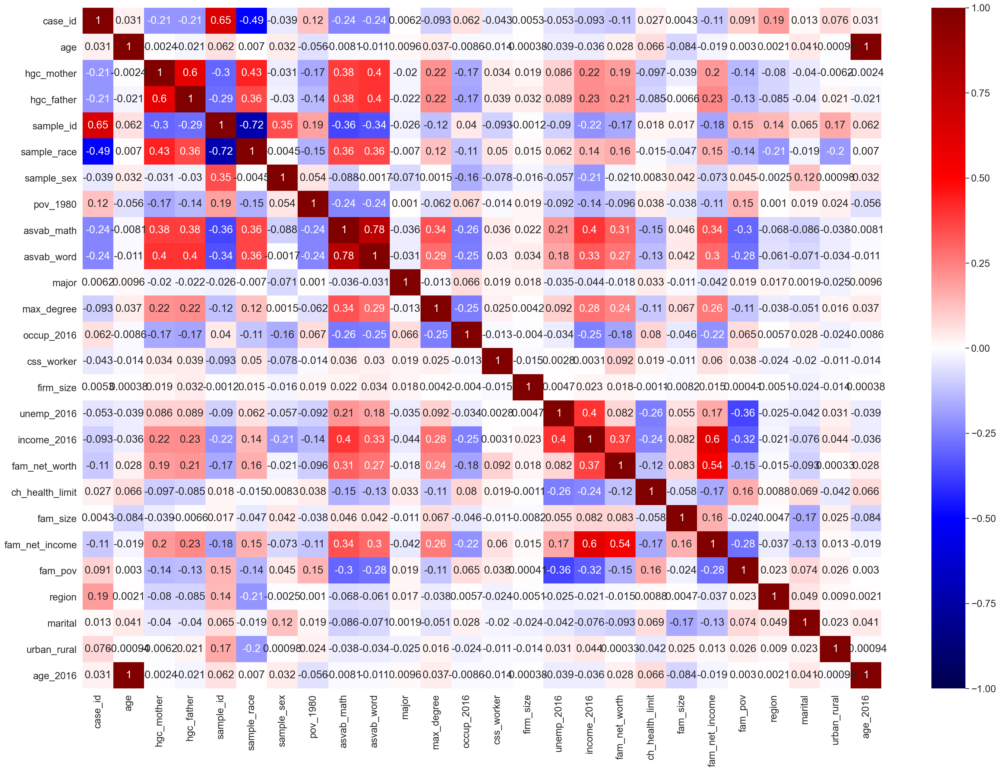

In [14]:
# Visualizing correlation with Seaborn
sns.set(rc={"figure.figsize": (30, 21)})
sns.set(font_scale=1.5)  # crazy big
sns.heatmap(unemp_2016_2.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

$$
P(unemp_{2016} = 1~|~X) = \frac{\exp(z)}{1 + \exp(z)},
$$

where $z$ is given by

$$
\begin{align} z = \theta + w_1 ~ age_{2016} + w_2 ~sample\_race + w_3 ~sample_sex +  w_4 ~asvab\_math + w_5 ~asvab\_word \\ + w_6 ~major + w_7 ~max\_degree + w_8 ~occup_{2016} + w_9 ~css\_worker + \\ w_{10} ~firm\_size + w_{11} ~income_{2016} + w_{12} ~region + w_{13} ~marital + w_{14} ~urban\_rural \end{align}
$$

In [16]:
X1 = unemp_2016_2[
    [
        "age_2016",
        "sample_race",
        "sample_sex",
        "asvab_math",
        "asvab_word",
        "major",
        "max_degree",
        "occup_2016",
        "css_worker",
        "firm_size",
        "income_2016",
        "region",
        "marital",
        "urban_rural",
    ]
]

# X1 = sm.add_constant(X1)

y1 = unemp_2016_2["unemp_2016"]

logit_1 = sm.Logit(y1, X1).fit()

Optimization terminated successfully.
         Current function value: 0.514694
         Iterations 7


In [17]:
print(logit_1.summary2())

                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.239    
Dependent Variable: unemp_2016       AIC:              7143.1326
Date:               2020-04-14 05:43 BIC:              7238.9068
No. Observations:   6912             Log-Likelihood:   -3557.6  
Df Model:           13               LL-Null:          -4677.4  
Df Residuals:       6898             LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     7.0000                                      
-----------------------------------------------------------------
              Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
-----------------------------------------------------------------
age_2016     -0.0410    0.0046  -8.9666  0.0000  -0.0500  -0.0320
sample_race  -0.0561    0.0426  -1.3158  0.1882  -0.1396   0.0274
sample_sex    0.3413    0.0613   5.5655  0.0000   0.2211   0.4615
asvab_math    0.0004    0.0005   0.7140  0.4

In [18]:
print(logit_1.get_margeff(at="mean", method="dydx").summary())

        Logit Marginal Effects       
Dep. Variable:             unemp_2016
Method:                          dydx
At:                              mean
                 dy/dx    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
age_2016       -0.0085      0.001     -8.879      0.000      -0.010      -0.007
sample_race    -0.0116      0.009     -1.316      0.188      -0.029       0.006
sample_sex      0.0706      0.013      5.557      0.000       0.046       0.095
asvab_math   7.295e-05      0.000      0.714      0.475      -0.000       0.000
asvab_word  -3.816e-06   9.77e-05     -0.039      0.969      -0.000       0.000
major       -1.083e-05   5.73e-06     -1.889      0.059   -2.21e-05    4.04e-07
max_degree     -0.0052      0.005     -1.000      0.317      -0.015       0.005
occup_2016   2.041e-05   2.87e-06      7.112      0.000    1.48e-05     2.6e-05
css_worker      0.0425      0.007      5.684    

In [19]:
unemp_2016_2["logit_1_prob"] = logit_1.predict()
unemp_2016_2

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,case_id,age,hgc_mother,hgc_father,sample_id,sample_race,sample_sex,pov_1980,asvab_math,asvab_word,...,fam_net_worth,ch_health_limit,fam_size,fam_net_income,fam_pov,region,marital,urban_rural,age_2016,logit_1_prob
1,2,20,5.0,8.000000,5,3,2,0.000000,377.000000,369.000000,...,423345.891058,40.59771,4.0,91078.709839,0.170348,1.0,1.0,1.0,57,0.456230
2,3,17,10.0,12.000000,5,3,2,0.202167,475.040082,475.071774,...,115000.000000,20.00000,2.0,79000.000000,0.000000,4.0,1.0,1.0,54,0.590136
3,4,16,11.0,12.000000,5,3,2,0.000000,493.000000,544.000000,...,112850.000000,70.00000,2.0,144600.000000,0.000000,4.0,1.0,1.0,53,0.933141
5,6,18,12.0,12.000000,1,3,1,0.000000,681.000000,692.000000,...,95825.000000,30.00000,4.0,169010.000000,0.000000,2.0,1.0,1.0,55,0.968484
7,8,20,9.0,6.000000,6,3,2,0.000000,428.000000,681.000000,...,172717.000000,40.00000,4.0,47000.000000,0.000000,1.0,1.0,1.0,57,0.685388
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12647,12648,20,16.0,12.000000,16,2,1,0.000000,475.040082,475.071774,...,423345.891058,0.00000,4.0,80000.000000,0.000000,3.0,1.0,1.0,57,0.848385
12658,12659,21,5.0,10.947426,16,2,1,0.000000,475.040082,475.071774,...,423345.891058,50.00000,2.0,81500.000000,0.000000,2.0,1.0,1.0,58,0.739614
12662,12663,21,9.0,6.000000,15,3,1,0.202167,475.040082,475.071774,...,62000.000000,10.00000,3.0,92000.000000,0.000000,3.0,1.0,1.0,58,0.920831
12666,12667,20,8.0,10.947426,20,1,2,0.000000,475.040082,475.071774,...,423345.891058,100.00000,2.0,16094.000000,0.000000,3.0,3.0,1.0,57,0.279970


In [20]:
unemp_2016_2["logit_1_pred"] = [
    0 if x < 0.5 else 1 for x in unemp_2016_2["logit_1_prob"]
]

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [21]:
cm = pd.crosstab(unemp_2016_2["unemp_2016"], unemp_2016_2["logit_1_pred"], margins=True)
cm

logit_1_pred,0,1,All
unemp_2016,,,
0.0,2130,701,2831
1.0,659,3422,4081
All,2789,4123,6912


In [22]:
TN = cm[0][0]
FP = cm[1][0]
FN = cm[0][1]
TP = cm[1][1]

accuracy = (TP + TN) / len(unemp_2016_2)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 0.8032
Error:		 0.1968
Sensitivity:	 0.8385
Specificity:	 0.7524


In [23]:
final_results = {}
res_logit_1 = """
=========================
      L O G I T  1
=========================
Classification Statistics
=========================
Accuracy:\t0.8032
Error:\t\t0.1968
Sensitivity:\t0.8385
Specificity:\t0.7524"""

final_results["logit_1"] = res_logit_1

1a. What is the predicted probability that a divorced black woman, with a 650 in Math_Asvab, 780 in Word_Asvab, a Ph.D. degree that majored in Law Enforcement and Corrections and Criminology and Criminal Justice, that works for the government at a firm of 100 people, an income of \$85k, living in a rural area in the Northeast had an unemployment spell during 2016?

In [109]:
one_a = pd.DataFrame(
    {
        "age_2016": [55],
        "sample_race": [2],
        "sample_sex": [2],
        "asvab_math": [650],
        "asvab_word": [700],
        "major": [2105],
        "max_degree": [6],
        "occup_2016": [1],
        "css_worker": [1],
        "firm_size": [100],
        "income_2016": [85000],
        "region": [1],
        "marital": [3],
        "urban_rural": [0],
    }
)

In [110]:
logit_1.predict(one_a)

0    0.888657
dtype: float64

After attempting to imagine hypothetical adults for the endogenous variables and seeing the abysmal high probability numbers, I decided to query for the most prevalent characteristics of the sample that didn't experience any periods unemployed during 2016.

In [26]:
resilient = unemp_2016_2[unemp_2016_2.unemp_2016 == 0]

After attempting to imagine hypothetical adults for the endogenous variables and seeing the abysmal high probability numbers, I decided to query for the most common characteristics of the sample that didn't experience any periods unemployed during 2016.

In [112]:
print("age_2016:\n", resilient["age_2016"].value_counts(normalize=True))
print("\n", "sample_race:\t", resilient["sample_race"].value_counts(normalize=True))
print("\n", "sample_sex:\t", resilient["sample_sex"].value_counts(normalize=True))
print("\n", "asvab_math:\n", resilient["asvab_math"].mean())
print("\n", "asvab_word:\n", resilient["asvab_word"].mean())
print("\n", "major:\n", resilient["major"].value_counts(normalize=True))
print("\n", "max_degree:\t", resilient["max_degree"].value_counts(normalize=True))
print("\n", "occup_2016:\t", resilient["occup_2016"].value_counts(normalize=True))
print("\n", "css_worker:\n", resilient["css_worker"].value_counts(normalize=True))
print("\n", "firm_size:\t", resilient["firm_size"].mean())
print("\n", "income_2016:\t", resilient["income_2016"].mean())
print("\n", "region:\n", resilient["region"].value_counts(normalize=True))
print("\n", "marital:\n", resilient["marital"].value_counts(normalize=True))
print("\n", "urban_rural:\n", resilient["urban_rural"].value_counts(normalize=True))

age_2016:
 55    0.150124
52    0.139880
53    0.128576
54    0.127870
56    0.127164
57    0.112681
58    0.106676
51    0.078418
59    0.028612
Name: age_2016, dtype: float64

 sample_race:	 3    0.439774
2    0.365948
1    0.194278
Name: sample_race, dtype: float64

 sample_sex:	 2    0.553161
1    0.446839
Name: sample_sex, dtype: float64

 asvab_math:
 447.24817223306803

 asvab_word:
 448.59574896594177

 major:
 1233.85069    0.648534
506.00000     0.030378
1203.00000    0.022607
0.00000       0.021547
501.00000     0.019075
                ...   
205.00000     0.000353
1204.00000    0.000353
429.00000     0.000353
981.00000     0.000353
2013.00000    0.000353
Name: major, Length: 140, dtype: float64

 max_degree:	 1.000000    0.564465
1.787833    0.270929
2.000000    0.054751
4.000000    0.051219
3.000000    0.034264
8.000000    0.014836
5.000000    0.008831
7.000000    0.000353
6.000000    0.000353
Name: max_degree, dtype: float64

 occup_2016:	 4245.218674    0.543624
9130.00

The most resilient employment individual's characteristics on average translate to:

- Age: 55 (15.01%)
- Race: Non-Black, Non-Hispanic (43.98%)
- Sample Sex: Female (55.32%)
- Average ASVAB Math: 447.25
- Average ASVAB Word: 448.60
- Major: Business Management and Administration (3%), Nursing (2.26%) (although the mode was the mean (1233), implying missing NaN value (64.86%) and that average was within Health Professions)
- Max Degree: High School (56.45%)
- Class of Worker: Private for profit company (28.51%) (although the mode was the mean, implying missing NaN value (56.45%))
- Occupation: (Mean NaN value Cleaning and Building Service Occupations (54%))
- Average Firm Size: 1295 people
- Average Income: \$15,838
- Region: South (45.78%)
- Marital status: Married (44.33%)
- Urban/Rural: Urban (75.52%)

In [28]:
non_resilient = unemp_2016_2[unemp_2016_2.unemp_2016 == 1]

In [29]:
print("age_2016:\n", non_resilient["age_2016"].value_counts(normalize=True))
print("\n", "sample_race:\t", non_resilient["sample_race"].value_counts(normalize=True))
print("\n", "sample_sex:\t", non_resilient["sample_sex"].value_counts(normalize=True))
print("\n", "asvab_math:\n", non_resilient["asvab_math"].mean())
print("\n", "asvab_word:\n", non_resilient["asvab_word"].mean())
print("\n", "major:\n", non_resilient["major"].value_counts(normalize=True))
print("\n", "max_degree:\t", non_resilient["max_degree"].value_counts(normalize=True))
print("\n", "css_worker:\n", non_resilient["css_worker"].value_counts(normalize=True))
print("\n", "occup_2016:\t", non_resilient["occup_2016"].value_counts(normalize=True))
print("\n", "firm_size:\t", non_resilient["firm_size"].mean())
print("\n", "income_2016:\t", non_resilient["income_2016"].mean())
print("\n", "region:\n", non_resilient["region"].value_counts(normalize=True))
print("\n", "marital:\n", non_resilient["marital"].value_counts(normalize=True))
print("\n", "urban_rural:\n", non_resilient["urban_rural"].value_counts(normalize=True))

age_2016:
 54    0.144817
53    0.144082
52    0.144082
55    0.133056
56    0.111737
58    0.108307
57    0.098260
51    0.092379
59    0.023279
Name: age_2016, dtype: float64

 sample_race:	 3    0.529772
2    0.283019
1    0.187209
Name: sample_race, dtype: float64

 sample_sex:	 1    0.505023
2    0.494977
Name: sample_sex, dtype: float64

 asvab_math:
 488.54487130583885

 asvab_word:
 484.69862343985915

 major:
 1233.85069    0.508699
506.00000     0.038961
501.00000     0.030630
0.00000       0.027689
502.00000     0.024504
                ...   
1010.00000    0.000245
822.00000     0.000245
1209.00000    0.000245
815.00000     0.000245
1006.00000    0.000245
Name: major, Length: 186, dtype: float64

 max_degree:	 1.000000    0.568488
1.787833    0.144572
4.000000    0.104386
3.000000    0.071551
2.000000    0.065915
5.000000    0.020828
8.000000    0.017153
7.000000    0.006371
6.000000    0.000735
Name: max_degree, dtype: float64

 css_worker:
 2.000000    0.513600
1.000000  

The most non-resilient employment individual's characteristics on average translate to:

- Age: 54 (14.48%)
- Race: Non-Black, Non-Hispanic (52.98%)
- Sample Sex: Male (50.5%)
- Average ASVAB Math: 488.54
- Average ASVAB Word: 484.70
- Major: Business Management and Administration (3.9%), Business and Commerce, General (3.06%) (although the mode was the mean (1233), implying missing NaN value (64.86%) and that average was within Health Professions)
- Max Degree: High School (56.85%)
- Class of Worker: Private for profit company (51.36%)
- Occupation: Transportation and Material Moving Workers (3.11%)
- Average Firm Size: 1360 people
- Average Income: \$62,512
- Region: South (40.85%)
- Marital status: Married (59.72%)
- Urban/Rural: Urban (78.27%)

From both analyses `resilient` and `non_resilient` there are key takeaways.

- ASVAB scores were higher for `non_resilient`.
- Several variables were either nearly identical or identical in values (Race, ASVAB scores, Class of Worker, Max Degree, Marital Status, Region, Urban/Rural, Average Firm Size).

The only significantly different variable was Average Income, implying, unfortunately, that when times get tough, lower wage jobs are more resilient than average paying jobs or that individuals that earn enough through passive income might be willingly unemployed.

Since $income_{2016}$ is so widely spread, I will categorize it 6 segments, with the following criteria:

- $income_{s1}$ will be individuals earning less than $\$12,000$
- $income_{s2}$ will be individuals earning $\$12,000$ or less than $\$31,000$
- $income_{s3}$ will be individuals earning $\$31,000$ or less than $\$45,000$
- $income_{s4}$ will be individuals earning $\$45,000$ or less than $\$60,000$
- $income_{s5}$ will be individuals earning $\$60,000$ or less than $\$95,000$
- $income_{s6}$ will be individuals earning $\$95,000$ or more


In [30]:
unemp_2016_2["income_s1"] = [
    1 if x < 12000.0 else 0 for x in unemp_2016_2["income_2016"]
]
unemp_2016_2["income_s2"] = [
    1 if (x >= 12000.0 and x < 31000.0) else 0 for x in unemp_2016_2["income_2016"]
]
unemp_2016_2["income_s3"] = [
    1 if (x >= 31000.0 and x < 45000.0) else 0 for x in unemp_2016_2["income_2016"]
]
unemp_2016_2["income_s4"] = [
    1 if (x >= 45000.0 and x < 60000.0) else 0 for x in unemp_2016_2["income_2016"]
]
unemp_2016_2["income_s5"] = [
    1 if (x >= 60000.0 and x < 95000.0) else 0 for x in unemp_2016_2["income_2016"]
]
unemp_2016_2["income_s6"] = [
    1 if x >= 95000.0 else 0 for x in unemp_2016_2["income_2016"]
]

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

In [31]:
unemp_2016_2

,case_id,age,hgc_mother,hgc_father,sample_id,sample_race,sample_sex,pov_1980,asvab_math,asvab_word,...,urban_rural,age_2016,logit_1_prob,logit_1_pred,income_s1,income_s2,income_s3,income_s4,income_s5,income_s6
1,2,20,5.0,8.000000,5,3,2,0.000000,377.000000,369.000000,...,1.0,57,0.456230,0,0,1,0,0,0,0
2,3,17,10.0,12.000000,5,3,2,0.202167,475.040082,475.071774,...,1.0,54,0.590136,1,0,1,0,0,0,0
3,4,16,11.0,12.000000,5,3,2,0.000000,493.000000,544.000000,...,1.0,53,0.933141,1,0,0,0,0,1,0
5,6,18,12.0,12.000000,1,3,1,0.000000,681.000000,692.000000,...,1.0,55,0.968484,1,0,0,0,0,0,1
7,8,20,9.0,6.000000,6,3,2,0.000000,428.000000,681.000000,...,1.0,57,0.685388,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12647,12648,20,16.0,12.000000,16,2,1,0.000000,475.040082,475.071774,...,1.0,57,0.848385,1,0,0,0,0,1,0
12658,12659,21,5.0,10.947426,16,2,1,0.000000,475.040082,475.071774,...,1.0,58,0.739614,1,0,0,1,0,0,0
12662,12663,21,9.0,6.000000,15,3,1,0.202167,475.040082,475.071774,...,1.0,58,0.920831,1,0,0,0,0,1,0
12666,12667,20,8.0,10.947426,20,1,2,0.000000,475.040082,475.071774,...,1.0,57,0.279970,0,1,0,0,0,0,0


In [32]:
xcatg = unemp_2016_2[
    [
        "age_2016",
        "sample_race",
        "sample_sex",
        "asvab_math",
        "asvab_word",
        "major",
        "max_degree",
        "occup_2016",
        "css_worker",
        "firm_size",
        "income_s1",
        "income_s2",
        "income_s3",
        "income_s4",
        "income_s5",
        "income_s6",
        "region",
        "marital",
        "urban_rural",
    ]
]


ycatg = unemp_2016_2["unemp_2016"]


logit_catg = sm.Logit(ycatg, xcatg).fit()

Optimization terminated successfully.
         Current function value: 0.438522
         Iterations 6


In [33]:
print(logit_catg.summary2())

                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.352    
Dependent Variable: unemp_2016       AIC:              6100.1247
Date:               2020-04-14 05:43 BIC:              6230.1040
No. Observations:   6912             Log-Likelihood:   -3031.1  
Df Model:           18               LL-Null:          -4677.4  
Df Residuals:       6893             LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     6.0000                                      
-----------------------------------------------------------------
              Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
-----------------------------------------------------------------
age_2016     -0.0105    0.0146  -0.7201  0.4715  -0.0390   0.0181
sample_race  -0.0874    0.0485  -1.8032  0.0714  -0.1824   0.0076
sample_sex    0.1982    0.0710   2.7919  0.0052   0.0590   0.3373
asvab_math    0.0007    0.0006   1.2233  0.2

In [34]:
print(logit_catg.get_margeff(at="mean", method="dydx").summary())

        Logit Marginal Effects       
Dep. Variable:             unemp_2016
Method:                          dydx
At:                              mean
                 dy/dx    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
age_2016       -0.0025      0.003     -0.720      0.471      -0.009       0.004
sample_race    -0.0209      0.012     -1.803      0.071      -0.044       0.002
sample_sex      0.0474      0.017      2.792      0.005       0.014       0.081
asvab_math      0.0002      0.000      1.223      0.221   -9.86e-05       0.000
asvab_word  -7.181e-05      0.000     -0.559      0.576      -0.000       0.000
major       -1.338e-05   6.98e-06     -1.917      0.055   -2.71e-05    3.03e-07
max_degree      0.0074      0.007      1.112      0.266      -0.006       0.020
occup_2016   8.621e-06   3.62e-06      2.382      0.017    1.53e-06    1.57e-05
css_worker      0.0804      0.010      8.028    

In [35]:
unemp_2016_2["logit_catg_prob"] = logit_catg.predict()

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [36]:
unemp_2016_2["logit_catg_pred"] = [
    0 if x < 0.5 else 1 for x in unemp_2016_2["logit_catg_prob"]
]

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [37]:
cm_catg = pd.crosstab(
    unemp_2016_2["unemp_2016"], unemp_2016_2["logit_catg_pred"], margins=True
)
cm_catg

logit_catg_pred,0,1,All
unemp_2016,,,
0.0,1971,860,2831
1.0,308,3773,4081
All,2279,4633,6912


In [38]:
TN = cm_catg[0][0]
FP = cm_catg[1][0]
FN = cm_catg[0][1]
TP = cm_catg[1][1]

accuracy = (TP + TN) / len(unemp_2016_2)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 0.831
Error:		 0.169
Sensitivity:	 0.9245
Specificity:	 0.6962


In [39]:
res_logit_catg = """
=========================
    L O G I T  C A T G
=========================
Classification Statistics
=========================

Accuracy:\t0.831
Error:\t\t0.169
Sensitivity:\t0.9245
Specificity:\t0.6962
"""

final_results["logit_catg"] = res_logit_catg

In [40]:
from sklearn.tree import DecisionTreeClassifier

X = unemp_2016_2[
    [
        "age_2016",
        "sample_race",
        "sample_sex",
        "asvab_math",
        "asvab_word",
        "major",
        "max_degree",
        "occup_2016",
        "css_worker",
        "firm_size",
        "income_s1",
        "income_s2",
        "income_s3",
        "income_s4",
        "income_s5",
        "income_s6",
        "region",
        "marital",
        "urban_rural",
    ]
]
y = unemp_2016_2["unemp_2016"]

In [41]:
dtc_0 = DecisionTreeClassifier().fit(X, y)

In [42]:
unemp_2016_2["predictions"] = dtc_0.predict(X)

/home/daniel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [43]:
cm0 = pd.crosstab(unemp_2016_2["unemp_2016"], unemp_2016_2["predictions"], margins=True)
cm0

predictions,0.0,1.0,All
unemp_2016,,,
0.0,2831,0,2831
1.0,0,4081,4081
All,2831,4081,6912


In [44]:
TN = cm0[0][0]
FP = cm0[1][0]
FN = cm0[0][1]
TP = cm0[1][1]

accuracy = (TP + TN) / len(unemp_2016_2)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 1.0
Error:		 0.0
Sensitivity:	 1.0
Specificity:	 1.0


In [45]:
dtc_1_res = """
=========================
D E C I S I O N  T R E E
=========================
Classification Statistics
=========================
Accuracy:\t1.0
Error:\t\t0.0
Sensitivity:\t1.0
Specificity:\t1.0
"""
final_results["DTC_1"] = dtc_1_res

### R-squared

In [46]:
R2 = unemp_2016_2["unemp_2016"].corr(unemp_2016_2["predictions"]) ** 2
R2

0.9999999999999998

### Variable Importance

In [47]:
importances = dtc_0.feature_importances_
indices = np.argsort(importances)[::-1]

for i in range(X.shape[1]):
    print(f"{i + 1} {X.columns[indices[i]]} ({round(importances[indices[i]],4)})")

1 income_s1 (0.4221)
2 occup_2016 (0.0897)
3 asvab_math (0.0808)
4 asvab_word (0.0708)
5 css_worker (0.0704)
6 firm_size (0.0607)
7 age_2016 (0.0418)
8 major (0.0358)
9 region (0.0268)
10 marital (0.0242)
11 max_degree (0.0202)
12 sample_race (0.014)
13 urban_rural (0.0119)
14 sample_sex (0.0098)
15 income_s2 (0.006)
16 income_s5 (0.0052)
17 income_s3 (0.005)
18 income_s4 (0.0038)
19 income_s6 (0.001)


## Train / Test

In [48]:
df2 = unemp_2016_2[
    [
        "unemp_2016",
        "age_2016",
        "sample_race",
        "sample_sex",
        "asvab_math",
        "asvab_word",
        "major",
        "max_degree",
        "occup_2016",
        "css_worker",
        "firm_size",
        "income_s1",
        "income_s2",
        "income_s3",
        "income_s4",
        "income_s5",
        "income_s6",
        "region",
        "marital",
        "urban_rural",
    ]
]

In [49]:
exogenous = [
    "age_2016",
    "sample_race",
    "sample_sex",
    "asvab_math",
    "asvab_word",
    "major",
    "max_degree",
    "occup_2016",
    "css_worker",
    "firm_size",
    "income_s1",
    "income_s2",
    "income_s3",
    "income_s4",
    "income_s5",
    "income_s6",
    "region",
    "marital",
    "urban_rural",
]
endogenous = "unemp_2016"

In [50]:
train = df2.sample(frac=0.8)
test = df2.drop(train.index)

In [51]:
len(df2), len(train), len(test)

(6912, 5530, 1382)

In [52]:
X_train = train[exogenous]
y_train = train[endogenous]

In [53]:
X_test = test[exogenous]
y_test = test[endogenous]

### Logit Model

In [54]:
import statsmodels.api as sm

logit_2 = sm.Logit(y_train, X_train).fit()
print(logit_2.summary2())

Optimization terminated successfully.
         Current function value: 0.437829
         Iterations 6
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.353    
Dependent Variable: unemp_2016       AIC:              4880.3836
Date:               2020-04-14 05:43 BIC:              5006.1246
No. Observations:   5530             Log-Likelihood:   -2421.2  
Df Model:           18               LL-Null:          -3742.6  
Df Residuals:       5511             LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     6.0000                                      
-----------------------------------------------------------------
              Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
-----------------------------------------------------------------
age_2016     -0.0119    0.0163  -0.7296  0.4656  -0.0438   0.0200
sample_race  -0.0958    0.0545  -1.7567  0.0790  -0.2027   0.0111
sample_s

In [55]:
print(logit_2.get_margeff(at="mean", method="dydx").summary())

        Logit Marginal Effects       
Dep. Variable:             unemp_2016
Method:                          dydx
At:                              mean
                 dy/dx    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
age_2016       -0.0028      0.004     -0.730      0.466      -0.010       0.005
sample_race    -0.0229      0.013     -1.757      0.079      -0.049       0.003
sample_sex      0.0423      0.019      2.226      0.026       0.005       0.080
asvab_math   5.528e-05      0.000      0.370      0.712      -0.000       0.000
asvab_word   1.691e-05      0.000      0.118      0.906      -0.000       0.000
major       -1.502e-05   7.74e-06     -1.940      0.052   -3.02e-05    1.55e-07
max_degree      0.0065      0.007      0.886      0.376      -0.008       0.021
occup_2016   7.123e-06   4.05e-06      1.758      0.079   -8.17e-07    1.51e-05
css_worker      0.0805      0.011      7.174    

### Train

In [56]:
train["logit_2_prob"] = logit_2.predict()

In [57]:
train.head()

,unemp_2016,age_2016,sample_race,sample_sex,asvab_math,asvab_word,major,max_degree,occup_2016,css_worker,...,income_s1,income_s2,income_s3,income_s4,income_s5,income_s6,region,marital,urban_rural,logit_2_prob
5667,0.0,58,3,1,548.000000,527.000000,1233.85069,1.000000,6230.0,2.0,...,0,0,0,0,1,0,4.0,3.0,0.0,0.850452
6320,0.0,55,2,2,459.000000,510.000000,603.00000,4.000000,2310.0,1.0,...,0,1,0,0,0,0,2.0,1.0,1.0,0.692409
12593,0.0,58,2,1,475.040082,475.071774,1233.85069,1.000000,3920.0,2.0,...,1,0,0,0,0,0,3.0,2.0,1.0,0.104167
6867,1.0,52,2,1,429.000000,407.000000,1233.85069,1.787833,5560.0,1.0,...,0,0,0,1,0,0,3.0,1.0,1.0,0.761544
3756,1.0,53,3,1,682.000000,674.000000,910.00000,5.000000,300.0,2.0,...,0,0,0,0,0,1,2.0,1.0,0.0,0.863137


In [58]:
train["logit_2_pred"] = [0 if x <= 0.5 else 1 for x in train["logit_2_prob"]]

In [59]:
train.head()

,unemp_2016,age_2016,sample_race,sample_sex,asvab_math,asvab_word,major,max_degree,occup_2016,css_worker,...,income_s2,income_s3,income_s4,income_s5,income_s6,region,marital,urban_rural,logit_2_prob,logit_2_pred
5667,0.0,58,3,1,548.000000,527.000000,1233.85069,1.000000,6230.0,2.0,...,0,0,0,1,0,4.0,3.0,0.0,0.850452,1
6320,0.0,55,2,2,459.000000,510.000000,603.00000,4.000000,2310.0,1.0,...,1,0,0,0,0,2.0,1.0,1.0,0.692409,1
12593,0.0,58,2,1,475.040082,475.071774,1233.85069,1.000000,3920.0,2.0,...,0,0,0,0,0,3.0,2.0,1.0,0.104167,0
6867,1.0,52,2,1,429.000000,407.000000,1233.85069,1.787833,5560.0,1.0,...,0,0,1,0,0,3.0,1.0,1.0,0.761544,1
3756,1.0,53,3,1,682.000000,674.000000,910.00000,5.000000,300.0,2.0,...,0,0,0,0,1,2.0,1.0,0.0,0.863137,1


In [60]:
cm2 = pd.crosstab(train["unemp_2016"], train["logit_2_pred"], margins=True)
cm2

logit_2_pred,0,1,All
unemp_2016,,,
0.0,1580,686,2266
1.0,246,3018,3264
All,1826,3704,5530


In [61]:
TN = cm2[0][0]
FP = cm2[1][0]
FN = cm2[0][1]
TP = cm2[1][1]

accuracy = (TP + TN) / len(train)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 0.8315
Error:		 0.1685
Sensitivity:	 0.9246
Specificity:	 0.6973


In [62]:
train_test = {}
train_logit = """
=========================
        T R A I N
=========================
        L O G I T
=========================
Classification Statistics
=========================
Accuracy:\t0.8284
Error:\t\t0.1716
Sensitivity:\t0.9228
Specificity:\t0.6939
"""
train_test["train_logit"] = train_logit

### Test

In [63]:
test["logit_2_prob"] = logit_2.predict(test[exogenous])

In [64]:
test["logit_2_pred"] = [0 if x <= 0.5 else 1 for x in test["logit_2_prob"]]

In [65]:
cm3 = pd.crosstab(test["unemp_2016"], test["logit_2_pred"], margins=True)
cm3

logit_2_pred,0,1,All
unemp_2016,,,
0.0,391,174,565
1.0,63,754,817
All,454,928,1382


In [66]:
TN = cm3[0][0]
FP = cm3[1][0]
FN = cm3[0][1]
TP = cm3[1][1]

accuracy = (TP + TN) / len(test)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 0.8285
Error:		 0.1715
Sensitivity:	 0.9229
Specificity:	 0.692


In [67]:
test_logit = """
=========================
         T E S T
=========================
        L O G I T
=========================
Classification Statistics
=========================
Accuracy:\t0.8415
Error:\t\t0.1585
Sensitivity:\t0.9302
Specificity:\t0.7078
"""
train_test["test_logit"] = test_logit

## Decision Tree Classifier

### Train

In [68]:
from sklearn import tree

In [69]:
dtc = tree.DecisionTreeClassifier().fit(X_train, y_train)

In [70]:
train["dtc_pred"] = dtc.predict(X_train)

In [71]:
cm4 = pd.crosstab(train["unemp_2016"], train["dtc_pred"], margins=True)
cm4

dtc_pred,0.0,1.0,All
unemp_2016,,,
0.0,2266,0,2266
1.0,0,3264,3264
All,2266,3264,5530


In [72]:
TN = cm4[0][0]
FP = cm4[1][0]
FN = cm4[0][1]
TP = cm4[1][1]

accuracy = (TP + TN) / len(train)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 1.0
Error:		 0.0
Sensitivity:	 1.0
Specificity:	 1.0


In [73]:
train_dtc = """
=========================
        T R A I N
=========================
D E C I S I O N  T R E E
=========================
Classification Statistics
=========================
Accuracy:\t1.0
Error:\t\t0.0
Sensitivity:\t1.0
Specificity:\t1.0
"""
train_test["train_dtc"] = train_dtc

In [74]:
importances = dtc.feature_importances_
indices = np.argsort(importances)[::-1]

for i in range(X_train.shape[1]):
    print(f"{i + 1} {X_train.columns[indices[i]]} ({round(importances[indices[i]],4)})")

1 income_s1 (0.4235)
2 asvab_math (0.0848)
3 asvab_word (0.0792)
4 occup_2016 (0.0776)
5 css_worker (0.0644)
6 firm_size (0.0588)
7 age_2016 (0.0448)
8 major (0.0434)
9 region (0.0296)
10 marital (0.0207)
11 max_degree (0.0206)
12 urban_rural (0.0108)
13 sample_race (0.01)
14 sample_sex (0.0085)
15 income_s2 (0.0064)
16 income_s4 (0.0049)
17 income_s5 (0.0044)
18 income_s6 (0.0042)
19 income_s3 (0.0036)


### Test

In [75]:
test["dtc_pred"] = dtc.predict(X_test)

In [76]:
cm5 = pd.crosstab(test["unemp_2016"], test["dtc_pred"], margins=True)
cm5

dtc_pred,0.0,1.0,All
unemp_2016,,,
0.0,413,152,565
1.0,172,645,817
All,585,797,1382


In [77]:
TN = cm5[0][0]
FP = cm5[1][0]
FN = cm5[0][1]
TP = cm5[1][1]

accuracy = (TP + TN) / len(test)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 0.7656
Error:		 0.2344
Sensitivity:	 0.7895
Specificity:	 0.731


In [78]:
test_dtc = """
=========================
        T E S T
=========================
D E C I S I O N  T R E E
=========================
Classification Statistics
=========================
Accuracy:\t0.7685
Error:\t\t0.2315
Sensitivity:\t0.7774
Specificity:\t0.755
"""
train_test["test_dtc"] = test_dtc

## K-Fold Cross Validation

In [79]:
from sklearn.model_selection import cross_val_score

In [80]:
dtc2 = tree.DecisionTreeClassifier()

In [81]:
cv_scores = cross_val_score(dtc2, X_train, y_train, cv=6)  # 10-fold crossvalidation

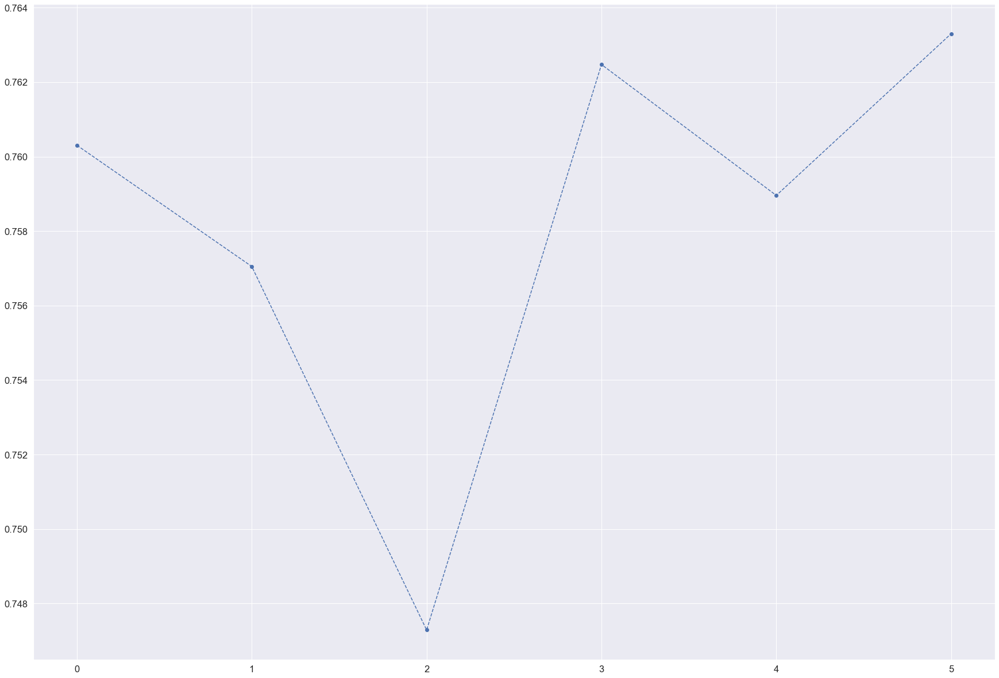

In [82]:
plt.plot(range(0, len(cv_scores + 1)), cv_scores, "--o")
plt.show()

In [83]:
cv_scores.max()

0.7633007600434311

## Parameter Tuning

In [84]:
dtc.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': None,
 'splitter': 'best'}

In [85]:
criterion = ["gini", "entropy"]

max_depth = [int(x) for x in np.linspace(10, 110, 11)]
max_depth.append(None)

max_features = ["auto", "sqrt", "log2"]
min_samples_leaf = [1, 2, 5, 10]

grid = {
    "criterion": criterion,
    "max_depth": max_depth,
    "max_features": max_features,
    "min_samples_leaf": min_samples_leaf,
}
grid

{'criterion': ['gini', 'entropy'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt', 'log2'],
 'min_samples_leaf': [1, 2, 5, 10]}

In [86]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

In [87]:
grid_search = GridSearchCV(
    dtc2, param_grid=grid, cv=StratifiedKFold(n_splits=10)
)  # Edit n_splits = 5, 10, 25

In [88]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
    

In [89]:
grid_search.best_score_

0.8180831826401447

In [90]:
dtc2 = grid_search.best_estimator_

In [91]:
dtc2.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [92]:
test["dtc2_pred"] = dtc2.predict(X_test)

In [93]:
cm6 = pd.crosstab(test["unemp_2016"], test["dtc2_pred"], margins=True)
cm6

dtc2_pred,0.0,1.0,All
unemp_2016,,,
0.0,391,174,565
1.0,64,753,817
All,455,927,1382


In [94]:
TN = cm6[0][0]
FP = cm6[1][0]
FN = cm6[0][1]
TP = cm6[1][1]

accuracy = (TP + TN) / len(test)
error = 1 - accuracy
sensitivity = TP / (FN + TP)
specificity = TN / (TN + FP)

print("Accuracy:\t", round(accuracy, 4))
print("Error:\t\t", round(error, 4))
print("Sensitivity:\t", round(sensitivity, 4))
print("Specificity:\t", round(specificity, 4))

Accuracy:	 0.8278
Error:		 0.1722
Sensitivity:	 0.9217
Specificity:	 0.692


In [95]:
test_dtc_fold = """
=========================
        T E S T
=========================
   K - F O L D  D T C
=========================
Classification Statistics
=========================
Accuracy:\t0.8329
Error:\t\t0.1671
Sensitivity:\t0.935
Specificity:\t0.6788
"""
train_test["test_dtc_fold"] = test_dtc_fold

In [96]:
for x in final_results:
    print(final_results[x])


      L O G I T  1
Classification Statistics
Accuracy:	0.8032
Error:		0.1968
Sensitivity:	0.8385
Specificity:	0.7524

    L O G I T  C A T G
Classification Statistics

Accuracy:	0.831
Error:		0.169
Sensitivity:	0.9245
Specificity:	0.6962


D E C I S I O N  T R E E
Classification Statistics
Accuracy:	1.0
Error:		0.0
Sensitivity:	1.0
Specificity:	1.0



In [97]:
for x in train_test:
    print(train_test[x])


        T R A I N
        L O G I T
Classification Statistics
Accuracy:	0.8284
Error:		0.1716
Sensitivity:	0.9228
Specificity:	0.6939


         T E S T
        L O G I T
Classification Statistics
Accuracy:	0.8415
Error:		0.1585
Sensitivity:	0.9302
Specificity:	0.7078


        T R A I N
D E C I S I O N  T R E E
Classification Statistics
Accuracy:	1.0
Error:		0.0
Sensitivity:	1.0
Specificity:	1.0


        T E S T
D E C I S I O N  T R E E
Classification Statistics
Accuracy:	0.7685
Error:		0.2315
Sensitivity:	0.7774
Specificity:	0.755


        T E S T
   K - F O L D  D T C
Classification Statistics
Accuracy:	0.8329
Error:		0.1671
Sensitivity:	0.935
Specificity:	0.6788



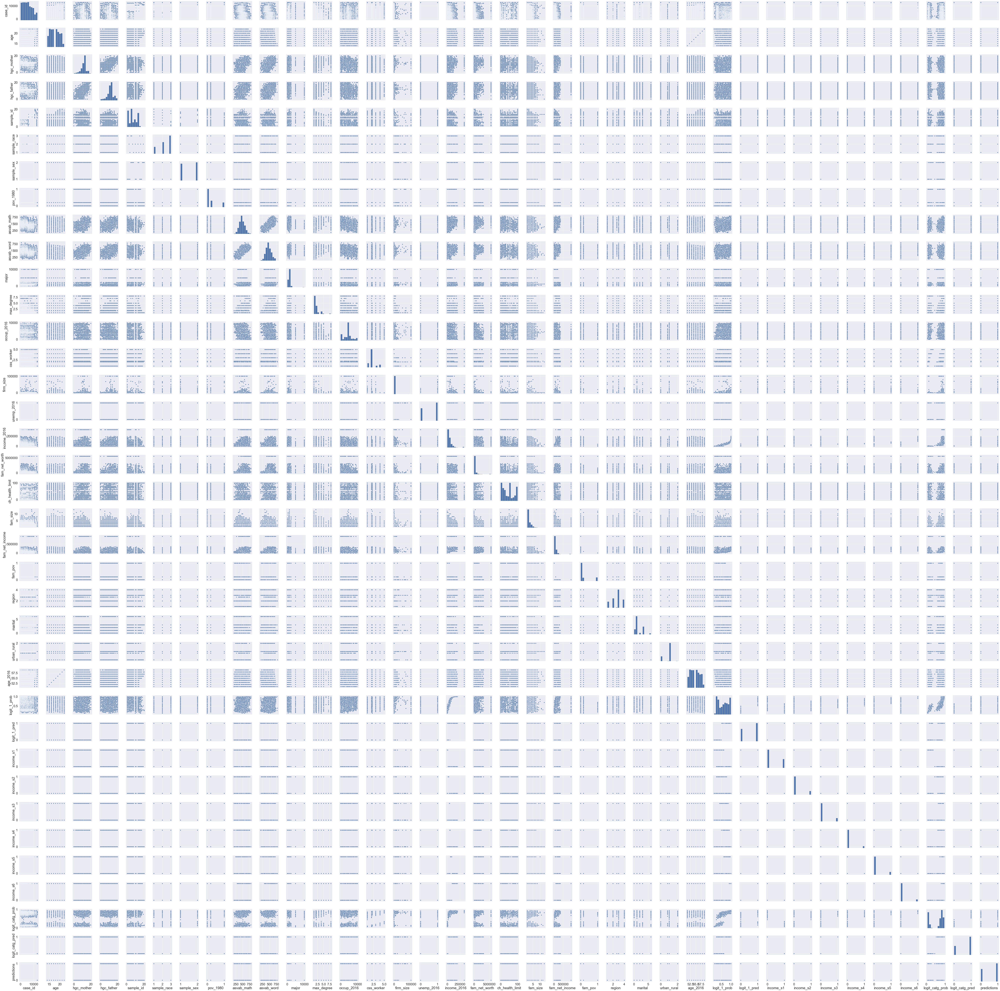

In [98]:
sns.set(rc={"figure.figsize": (40, 28)})
sns.set(font_scale=2)  # crazy big
sns.pairplot(unemp_2016_2)

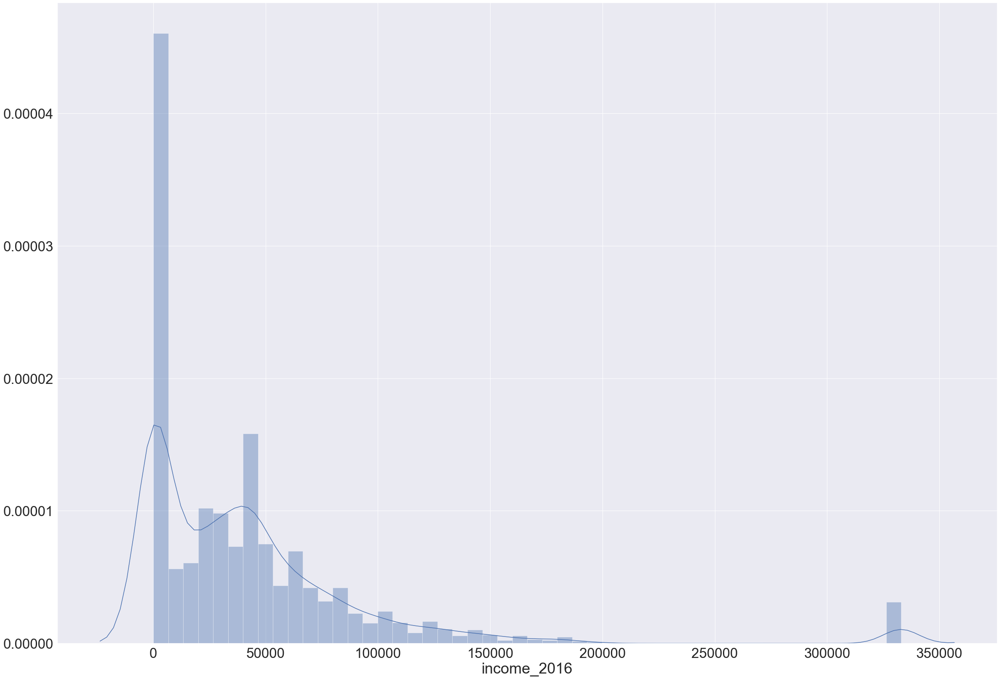

In [99]:
sns.set(rc={"figure.figsize": (40, 28)})
sns.set(font_scale=3)  # crazy big
x = unemp_2016_2["income_2016"]
sns.distplot(x)

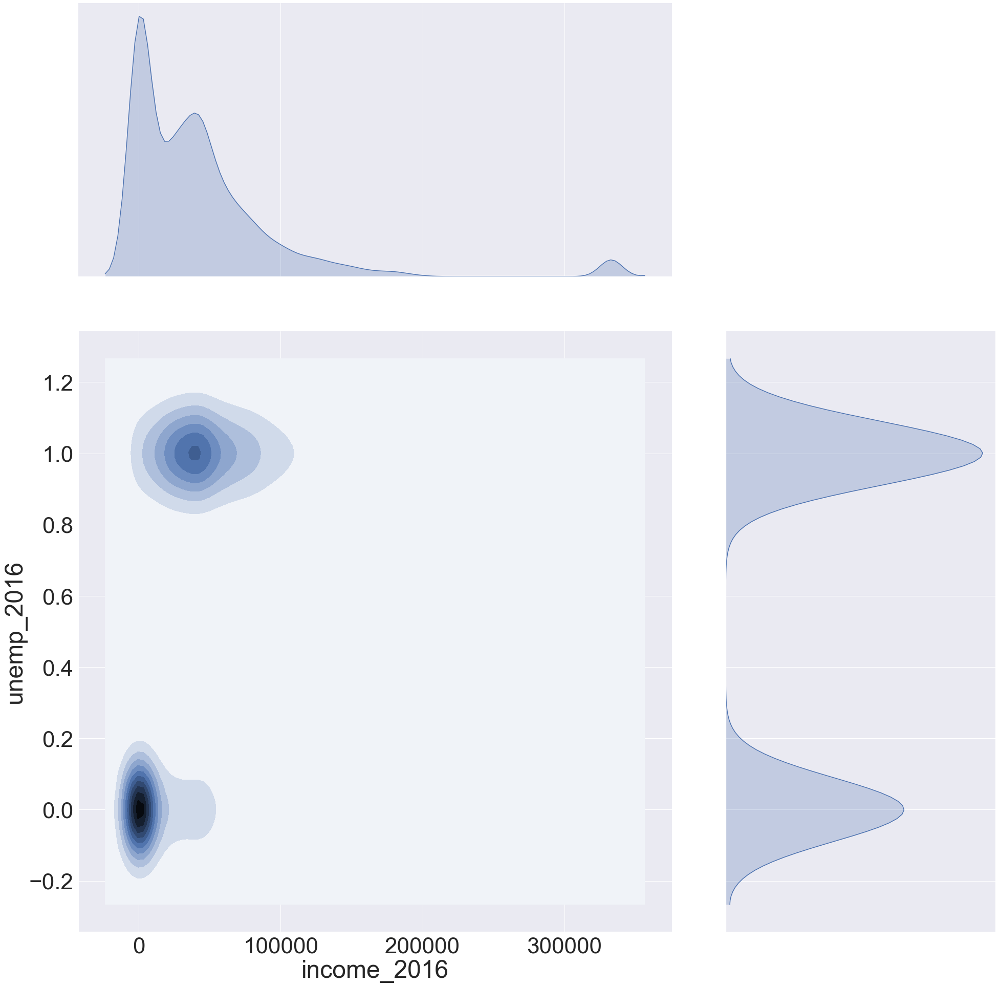

In [100]:
sns.set(font_scale=4)  # crazy big
sns.jointplot(
    x="income_2016", y="unemp_2016", data=unemp_2016_2, kind="kde", height=28, ratio=2
)

## OLS Regression for Income

In [101]:
X2 = df[
    [
        "age_2016",
        "hgc_mother",
        "hgc_father",
        "sample_race",
        "sample_sex",
        "pov_1980",
        "asvab_math",
        "asvab_word",
        "major",
        "max_degree",
        "occup_2016",
        "css_worker",
        "firm_size",
        "fam_pov",
        "region",
        "marital",
        "urban_rural",
    ]
]

X2 = sm.add_constant(X2)

y2 = df["income_2016"]

model = sm.OLS(y2, X2)
results = model.fit()
print(results.summary2())

                     Results: Ordinary least squares
Model:                 OLS               Adj. R-squared:      0.234      
Dependent Variable:    income_2016       AIC:                 302709.8237
Date:                  2020-04-14 05:53  BIC:                 302843.8923
No. Observations:      12686             Log-Likelihood:      -1.5134e+05
Df Model:              17                F-statistic:         229.0      
Df Residuals:          12668             Prob (F-statistic):  0.00       
R-squared:             0.235             Scale:               1.3487e+09 
-------------------------------------------------------------------------
               Coef.     Std.Err.    t     P>|t|     [0.025      0.975]  
-------------------------------------------------------------------------
const        86611.0788 8460.9465  10.2366 0.0000  70026.3437 103195.8139
age_2016      -771.5344  142.8779  -5.4000 0.0000  -1051.5967   -491.4721
hgc_mother     387.7507  138.3325   2.8030 0.0051    116.59

In [102]:
results.params

const          86611.078828
age_2016        -771.534374
hgc_mother       387.750676
hgc_father       241.632472
sample_race     -339.977318
sample_sex    -13168.462600
pov_1980       -2819.064887
asvab_math        62.971022
asvab_word         1.479423
major             -0.756930
max_degree      3788.522103
occup_2016        -4.513282
css_worker      -444.180026
firm_size          0.147758
fam_pov       -40472.160341
region            -6.512110
marital         -942.452228
urban_rural     6469.730759
dtype: float64

In [103]:
results.rsquared

0.23507873840206261

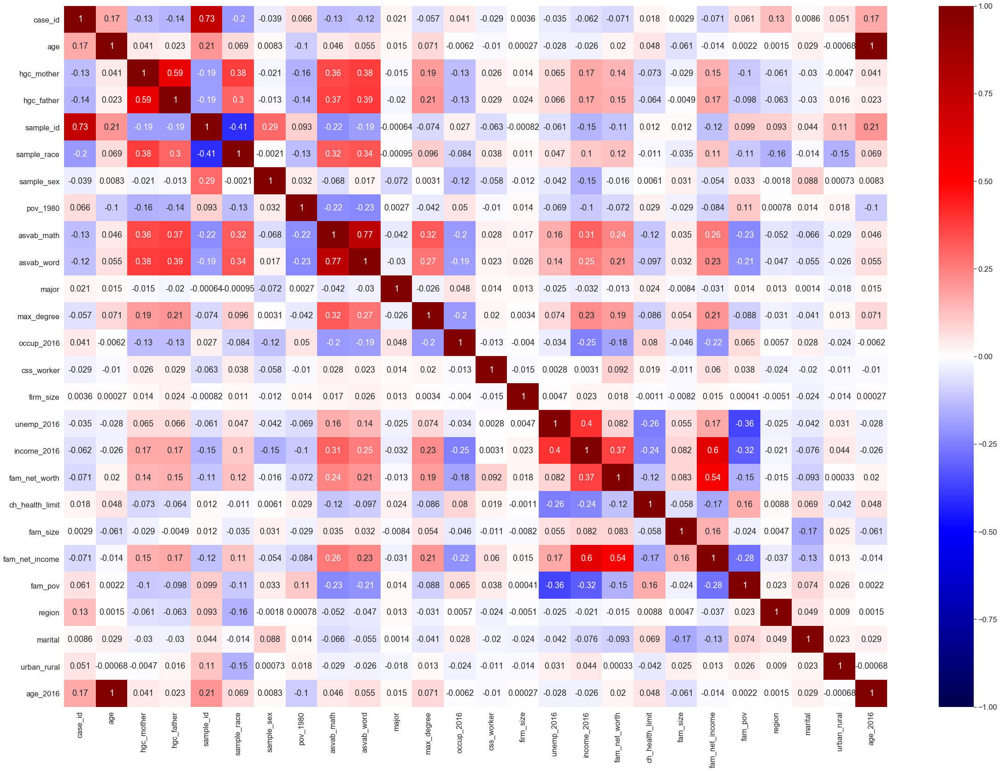

In [104]:
sns.set(rc={"figure.figsize": (40, 28)})
sns.set(font_scale=1.5)  # crazy big
sns.heatmap(df.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

In [105]:
df.drop(
    columns=[
        "case_id",
        "age_2016",
        "age",
        "major",
        "css_worker",
        "firm_size",
        "fam_size",
        "region",
        "urban_rural",
    ],
    axis=1,
    inplace=True,
)

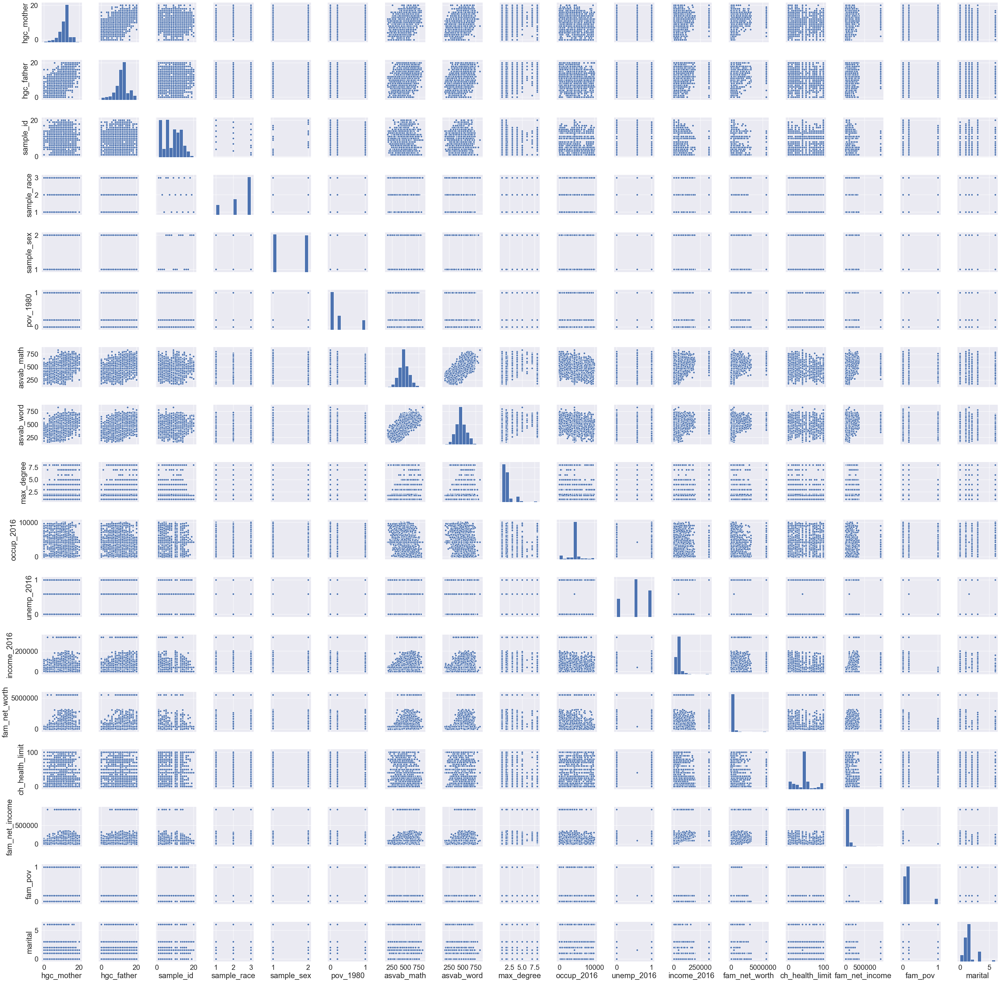

In [106]:
sns.set(rc={"figure.figsize": (40, 28)})
sns.set(font_scale=2)  # crazy big
sns.pairplot(df)

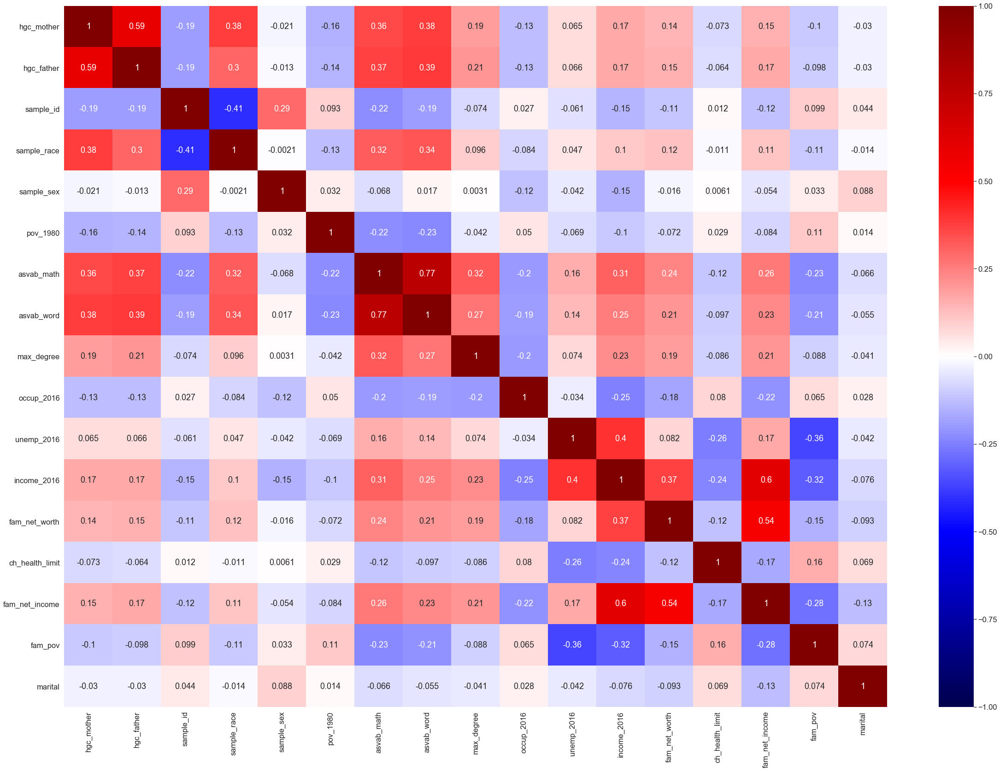

In [107]:
sns.set(rc={"figure.figsize": (40, 28)})
sns.set(font_scale=1.5)  # crazy big
sns.heatmap(df.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

In [108]:
X2 = df[
    [
        "hgc_mother",
        "hgc_father",
        "sample_race",
        "sample_sex",
        "pov_1980",
        "asvab_math",
        "asvab_word",
        "max_degree",
        "occup_2016",
        "fam_pov",
        "marital",
    ]
]

X2 = sm.add_constant(X2)

y2 = df["income_2016"]

model = sm.OLS(y2, X2)
results = model.fit()
print(results.summary2())

                     Results: Ordinary least squares
Model:                 OLS               Adj. R-squared:      0.230      
Dependent Variable:    income_2016       AIC:                 302776.5177
Date:                  2020-04-14 05:55  BIC:                 302865.8967
No. Observations:      12686             Log-Likelihood:      -1.5138e+05
Df Model:              11                F-statistic:         344.8      
Df Residuals:          12674             Prob (F-statistic):  0.00       
R-squared:             0.230             Scale:               1.3565e+09 
-------------------------------------------------------------------------
               Coef.     Std.Err.    t     P>|t|     [0.025      0.975]  
-------------------------------------------------------------------------
const        48755.7432 2721.5146  17.9149 0.0000  43421.1632  54090.3233
hgc_mother     403.4214  138.6770   2.9091 0.0036    131.5935    675.2493
hgc_father     285.6545  114.8400   2.4874 0.0129     60.55

We can interpret these refined results as:

- For each year of schooling that both parents completed, for higher scores of ASVAB score, Highest Degree finished, income will **increase**.
- Since for Sex is coded as $Female = 2$, we can infer that there women earn less than men regardless of qualifications.
- If family was in poverty in 1980, it will reduce up to $\$22.46.83$ income.
- Per each advancement of degree, e.g., from a Bachelor of Arts to Bachelor of Science, one can expect $\$3,700$ more in salary.
- If family is in poverty currently, one can infer that salary is $\$40,558$ less.
- If race is Black or Non-Black, Non-Hispanic, income is lower by nearly $\$1,000$, I suspect this is due to the majority of the subjects are Non-Black, Non Hispanic.